In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
# import networkx as nx

In [2]:
flight_data = pd.read_csv("../../samples_with_jfk_landing_flag.csv",
                          index_col = ["id", "ts"], low_memory = True,
                          usecols = ["id", "ts", "lat", "lon", "altitude", "azimuth", "destination", "ground_speed", "jfk_landing_flag"])
flight_data = flight_data.sort_values(by = ['id', 'ts']).reset_index(drop = True)
print(flight_data.head())
print(flight_data.shape)

/home/naveen/anaconda3/lib/python3.7/site-packages/numpy/lib/arraysetops.py:522: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


       lat      lon  altitude  azimuth  ground_speed  jfk_landing_flag  \
0  42.3111 -72.4232      4300       31           146             False   
1  41.7355 -74.2800      9200      323           262             False   
2  41.7577 -74.3025      9200      323           262             False   
3  41.7676 -74.3124      9200      323           262             False   
4  41.7775 -74.3224      9200      323           262             False   

  destination  
0         NaN  
1         NaN  
2         NaN  
3         NaN  
4         NaN  
(44011273, 7)


# Filtering the landing aircraft

In [3]:
flight_data['jfk_landing_flag'] = (flight_data['jfk_landing_flag'] & (flight_data['destination'] == 'JFK'))
flight_data['jfk_landing_flag'].sum()

2460846

# Discretizing space (and time - later)

In [4]:
flight_data['lon'] = flight_data['lon'].clip(-78, -68)
flight_data['lat'] = flight_data['lat'].clip(35, 45)
flight_data['altitude'] = flight_data['altitude'].clip(0, 50000)
flight_data['x'] = ((flight_data['lon'] + 78) * 10).apply(np.ceil).apply(int)
flight_data['y'] = ((flight_data['lat'] - 35) * 10).apply(np.ceil).apply(int)
flight_data['z'] = ((flight_data['altitude']) / 500).apply(np.ceil).apply(int)
print(flight_data['x'].min(), flight_data['x'].max())
print(flight_data['y'].min(), flight_data['y'].max())
print(flight_data['z'].min(), flight_data['z'].max())

0 100
0 100
0 90


In [ ]:
# landing_ac_data = flight_data[flight_data['jfk_landing_flag']].reset_index(drop = True)

In [2]:
landing_ac_data = pd.read_csv("../../landing_samples.csv", low_memory = True,
                          usecols = ["id", "ts", "lat", "lon", "altitude", "azimuth", "destination", "ground_speed", "jfk_landing_flag", "z"])
x_max = 200
y_max = 200
landing_ac_data['x'] = np.ceil((landing_ac_data['lon'] + 78)/0.05).apply(int).clip(0, 200)
landing_ac_data['y'] = np.ceil((landing_ac_data['lat'] - 35)/0.05).apply(int).clip(0, 200)

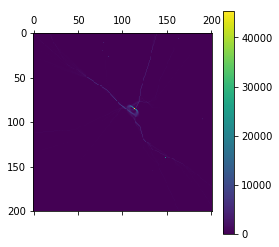

In [3]:
matrix = np.zeros((x_max + 1, y_max + 1))
for i in range(landing_ac_data.shape[0]):
    matrix[landing_ac_data['x'].iloc[i], landing_ac_data['y'].iloc[i]] += 1

# Cell counts in raw scale
plt.matshow(matrix)
plt.colorbar()
plt.savefig("lon_lat_discretized_count.png", dpi = 199)
plt.show()

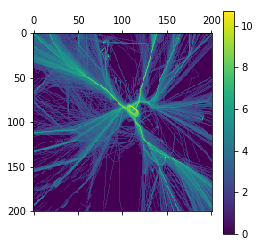

In [4]:
# Cell counts in log scale
matrix = np.log(1 + matrix)
plt.matshow(matrix)
plt.colorbar()
plt.savefig("lon_lat_discretized_log_count.png", dpi = 199)
plt.show()

In [3]:
# Creating lag columns and filtering
landing_ac_data['last_ts'] = landing_ac_data[['id', 'ts']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data['last_x'] = landing_ac_data[['id', 'x']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data['last_y'] = landing_ac_data[['id', 'y']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data['last_z'] = landing_ac_data[['id', 'z']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data['last_lon'] = landing_ac_data[['id', 'lon']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data['last_lat'] = landing_ac_data[['id', 'lat']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data['last_altitude'] = landing_ac_data[['id', 'altitude']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data = landing_ac_data[~landing_ac_data['last_ts'].apply(np.isnan)]
landing_ac_data['last_x'] = landing_ac_data['last_x'].apply(int)
landing_ac_data['last_y'] = landing_ac_data['last_y'].apply(int)
landing_ac_data['last_z'] = landing_ac_data['last_z'].apply(int)
print(landing_ac_data.shape)
landing_ac_data = landing_ac_data[(landing_ac_data['last_x'] != landing_ac_data['x']) | (landing_ac_data['last_y'] != landing_ac_data['y']) | (landing_ac_data['last_z'] != landing_ac_data['z'])]
print(landing_ac_data.shape)

(2484163, 19)
(1292629, 19)


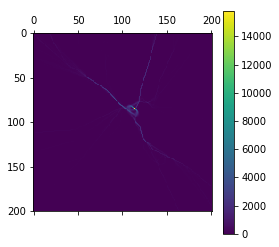

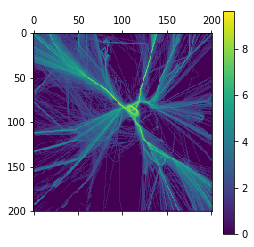

In [4]:
matrix = np.zeros((x_max + 1, y_max + 1))
for i in range(landing_ac_data.shape[0]):
    matrix[landing_ac_data['x'].iloc[i], landing_ac_data['y'].iloc[i]] += 1

# Cell counts in raw scale
plt.matshow(matrix)
plt.colorbar()
plt.savefig("lon_lat_discretized_postprocessed_count.png", dpi = 199)
plt.show()
matrix = np.log(1 + matrix)
# Cell counts in log scale
plt.matshow(matrix)
plt.colorbar()
plt.savefig("lon_lat_discretized_postprocessed_log_count.png", dpi = 199)
plt.show()

In [10]:
# Transition network - commented as the transition graph is not clear
# states = [[(x, y) for x in range(101)] for y in range(101)]
# states1 = []
# for i in range(len(states)):
#     states1 += states[i]

# states1 = {state: i for i, state in enumerate(states1)}
# matrix = np.zeros((len(states1.keys()), len(states1.keys())))

# for key in transitions1.keys():
#     row = transitions1[key]
#     for key1 in row.keys():
#         matrix[states1[key], states1[key1]] = row[key1]

# tr_mat = matrix/matrix.sum(axis = 1, keepdims = True)
# G = nx.MultiDiGraph()
# labels={}
# edge_labels={}

# for origin_state in states1.keys():
#     for destination_state in states1.keys():
#         i = states1[origin_state]
#         j = states1[destination_state]
#         rate = matrix[i][j]
#         if rate > 0:
#             G.add_edge(origin_state, destination_state, weight=rate, label="{:.02f}".format(rate))
#             edge_labels[(origin_state, destination_state)] = label="{:.02f}".format(rate)

# plt.figure(figsize=(10,7))
# node_size = 200
# pos = {state:list(state) for state in states1}
# nx.draw_networkx_edges(G,pos,width=1.0,alpha=0.5)
# nx.draw_networkx_labels(G, pos, font_weight=2)
# nx.draw_networkx_edge_labels(G, pos, edge_labels)
# plt.axis('off');
# plt.savefig("mc-matplotlib.svg", bbox_inches='tight')
# from networkx.drawing.nx_pydot import write_dot
# write_dot(G, 'mc.dot')
# !neato -Tps -Goverlap=scale mc.dot -o mc.ps; convert mc.ps mc.png

# Analyzing most frequent starting points

- start_point corresponds to lon-lat-altitude
- start_point1 corresponds to lon-lat

In [5]:
landing_ac_data = landing_ac_data.sort_values(['id', 'ts']).reset_index(drop = True)
start_point = landing_ac_data.groupby(['id']).first()
starts = {}
for i in range(start_point.shape[0]):
    x = start_point['last_x'].iloc[i]
    y = start_point['last_y'].iloc[i]
    z = start_point['last_z'].iloc[i]
    try:
        starts[(x,y,z)] += 1
    except:
        starts[(x,y,z)] = 1

print(len(starts.keys()))

starts1 = {}
for i in range(start_point.shape[0]):
    x = start_point['last_x'].iloc[i]
    y = start_point['last_y'].iloc[i]
    try:
        starts1[(x,y)] += 1
    except:
        starts1[(x,y)] = 1

print(len(starts1.keys()))
print(start_point.shape)
# Therefore we expect sparsity

2510
960
(7295, 18)


In [6]:
lis = sorted(starts.items(), key = lambda kv:(kv[1], kv[0]), reverse = True)
lis1 = sorted(starts1.items(), key = lambda kv:(kv[1], kv[0]), reverse = True)
str(lis[0][0])

'(85, 113, 0)'

In [7]:
# Transitions in discretized lon-lat space
landing_ac_data1 = landing_ac_data[(landing_ac_data['x'] != landing_ac_data['last_x']) | (landing_ac_data['y'] != landing_ac_data['last_y'])]
landing_ac_data1.shape

(1013486, 19)

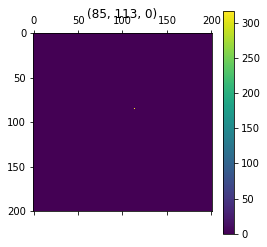

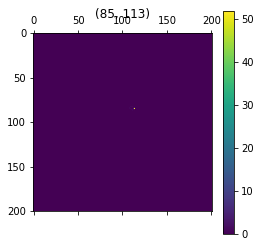

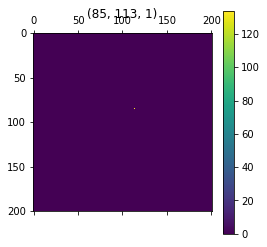

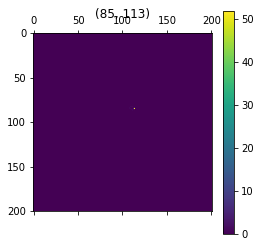

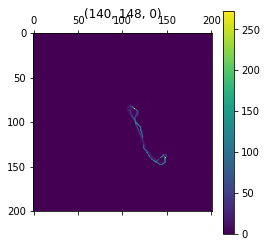

...

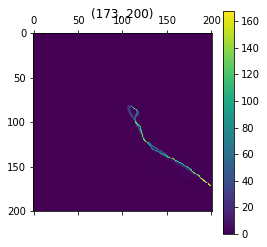

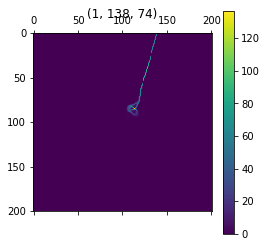

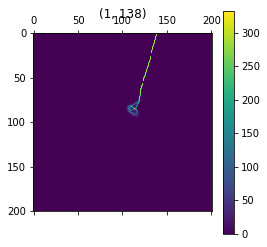

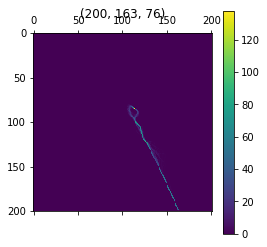

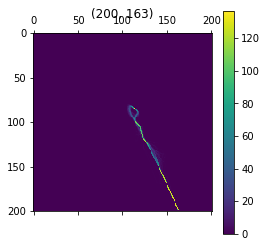

In [8]:
def get_flow_matrix(start_point_tuple, with_altitude = True):
    matrix = np.zeros((x_max + 1, y_max + 1))
    if with_altitude:
        starts_df = start_point[(start_point['last_x'] == start_point_tuple[0]) &
                                (start_point['last_y'] == start_point_tuple[1]) &
                                (start_point['last_z'] == start_point_tuple[2])]
    else:
        starts_df = start_point[(start_point['last_x'] == start_point_tuple[0]) &
                                (start_point['last_y'] == start_point_tuple[1])]
    if starts_df.shape[0] > 0:
        starts_df = starts_df.reset_index(drop = False)[['id']]
        if with_altitude:
            starts_df = starts_df.merge(landing_ac_data, on = ['id'])
        else:
            starts_df = starts_df.merge(landing_ac_data1, on = ['id'])
        starts_df = starts_df.sort_values(['id', 'ts']).reset_index(drop = True)
        for i in range(starts_df.shape[0]):
            matrix[starts_df['x'].iloc[i], starts_df['y'].iloc[i]] += 1
    
    return matrix

for item in lis[0:10]:
    matrix = get_flow_matrix(item[0])
    plt.matshow(matrix)
    plt.colorbar()
    plt.title(str(item[0]))
    plt.savefig("Transitions/lon_lat_discretized_count_" + str(item[0]) + "_with_altitude.png", dpi = 199)
    plt.show()
    matrix = get_flow_matrix(item[0], with_altitude = False)
    plt.matshow(matrix)
    plt.colorbar()
    plt.title(str(item[0][0:2]))
    plt.savefig("Transitions/lon_lat_discretized_count_" + str(item[0][0:2]) + "_without_altitude.png", dpi = 199)
    plt.show()

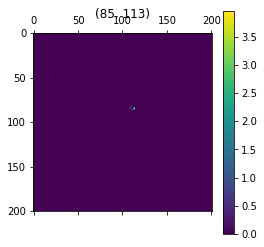

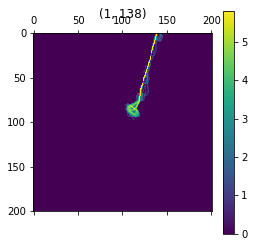

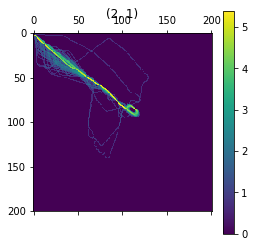

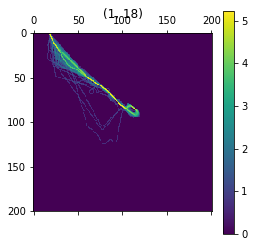

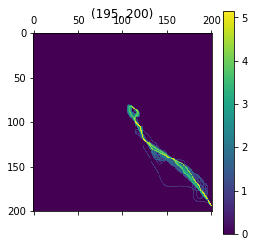

...

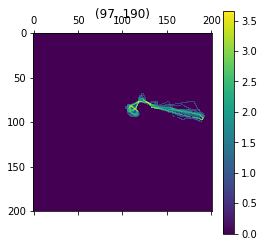

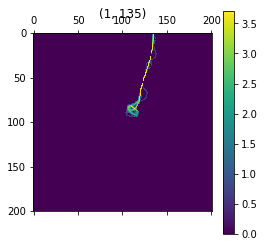

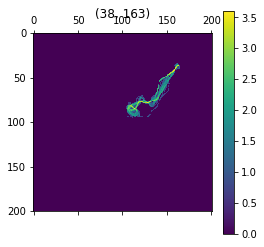

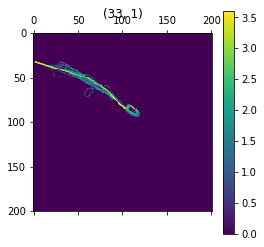

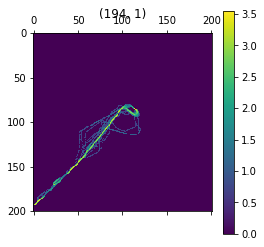

/home/naveen/anaconda3/lib/python3.7/site-packages/matplotlib/axis.py:1081: UserWarning: Unable to find pixel distance along axis for interval padding of ticks; assuming no interval padding needed.
  warnings.warn("Unable to find pixel distance along axis "


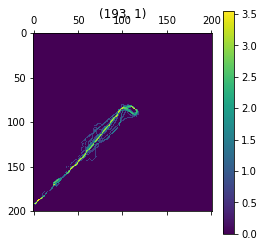

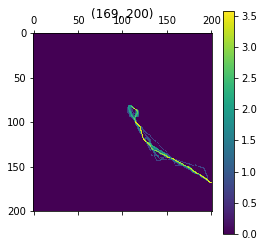

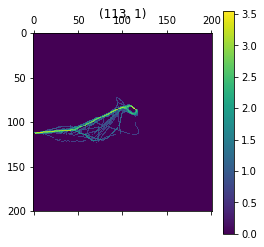

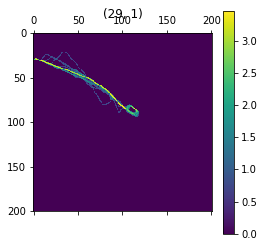

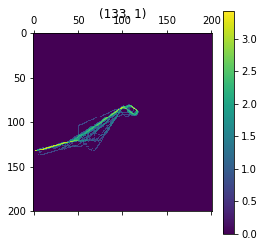

...

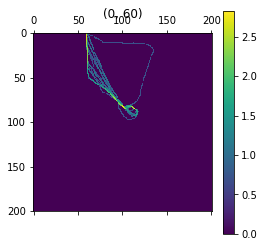

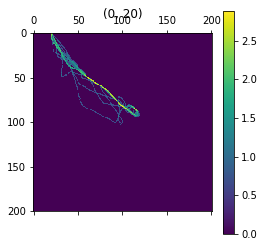

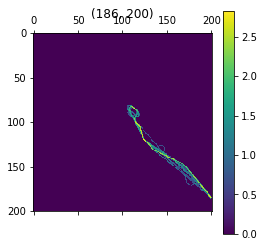

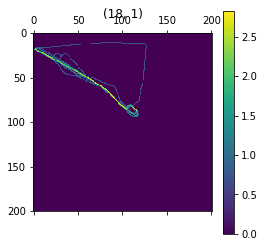

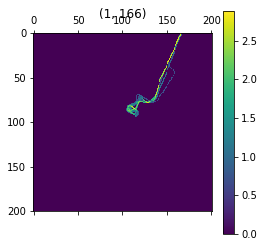

In [12]:
for item in lis1[0:100]:
    matrix = get_flow_matrix(item[0], with_altitude = False)
    matrix = np.log(1 + matrix)
    plt.matshow(matrix)
    plt.colorbar()
    plt.title(str(item[0]))
    plt.savefig("Transitions/lon_lat_count_" + str(item[0]) + ".png", dpi = 199)
    plt.show()

In [10]:
transitions = {} # For lon-lat-altitude point state transitions
transitions1 = {} # For lon-lat point state transitions
for i in range(landing_ac_data.shape[0]):
    last_x = landing_ac_data['last_x'].iloc[i]
    last_y = landing_ac_data['last_y'].iloc[i]
    last_z = landing_ac_data['last_z'].iloc[i]
    x = landing_ac_data['x'].iloc[i]
    y = landing_ac_data['y'].iloc[i]
    z = landing_ac_data['z'].iloc[i]
    try:
        transitions[(last_x, last_y, last_z)][(x, y, z)] += 1
    except:
        try:
            transitions[(last_x, last_y, last_z)][(x, y, z)] = 1
        except:
            transitions[(last_x, last_y, last_z)] = {(x, y, z): 1}
    try:
        transitions1[(last_x, last_y)][(x, y)] += 1
    except:
        try:
            transitions1[(last_x, last_y)][(x, y)] = 1
        except:
            transitions1[(last_x, last_y)] = {(x, y): 1}

In [11]:
print(len(transitions.keys()))
# Locations with more than 1 transition states
print(len([key for key in transitions.keys() if len(transitions[key].values()) > 1]))
# Locations with more than 1 transition
print(len([key for key in transitions.keys() if sum(transitions[key].values()) > 1]))
# Count of all lon-lat cells with at least 1 aircraft transition (max 10201)
print(len(transitions1.keys()))
# Locations with more than 1 transition states
# (max 10201)
print(len([key for key in transitions1.keys() if len(transitions1[key].values()) > 1]))
# Locations with more than 1 transition
# (max 10201)
print(len([key for key in transitions1.keys() if sum(transitions1[key].values()) > 1]))

74732
35804
43163
7891
6401
6975


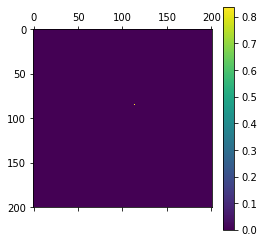

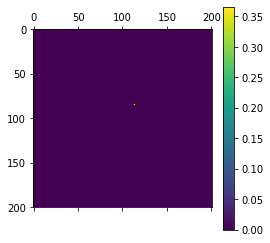

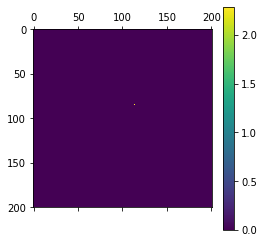

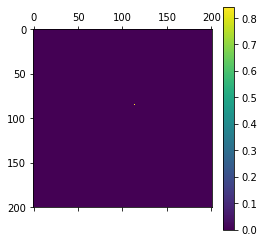

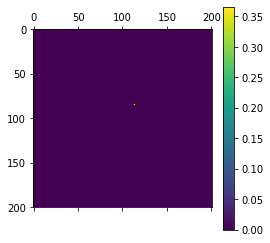

...

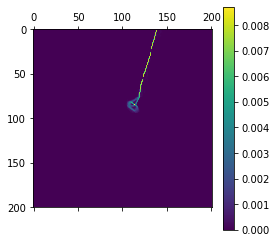

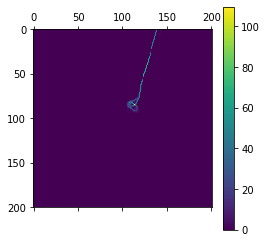

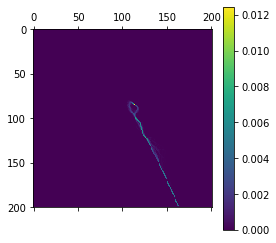

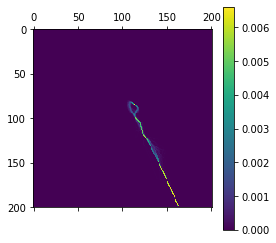

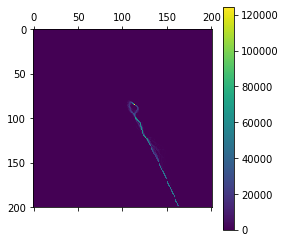

In [18]:
for item in lis[0:10]:
    matrix = get_flow_matrix(item[0])
    plt.matshow(matrix/np.sum(matrix))
    plt.colorbar()
    plt.show()
    matrix1 = get_flow_matrix(item[0], with_altitude = False)
    plt.matshow(matrix1/np.sum(matrix1))
    plt.colorbar()
    plt.show()
    mat = (matrix/matrix.sum())/(matrix1[item[0][0], item[0][1]]/matrix1.sum() + 0.0000001)
    plt.matshow(mat)
    plt.colorbar()
    plt.show()

In [12]:
start_point_tuple = lis[0][0]
starts_df = start_point[(start_point['last_x'] == start_point_tuple[0]) &
                                (start_point['last_y'] == start_point_tuple[1]) &
                                (start_point['last_z'] == start_point_tuple[2])]
starts_df = starts_df.reset_index(drop = False)[['id']]
starts_df = starts_df.merge(landing_ac_data, on = ['id'])
starts_df = starts_df.sort_values(['id', 'ts']).reset_index(drop = True)
starts_df.head()

,id,aircraft,lat,lon,ts,altitude,climb_rate,azimuth,ground_speed,jfk_landing_flag,...,x,y,z,last_ts,last_x,last_y,last_z,last_lon,last_lat,last_altitude
0,A137AF_33,A137AF,35.1003,-77.9110,1560646039,35000,0,32,460,True,...,1,2,70,1.560646e+09,1,1,70,-77.9229,35.0852,35000.0
1,A137AF_33,A137AF,35.1145,-77.8997,1560646046,35000,0,32,460,True,...,2,2,70,1.560646e+09,1,2,70,-77.9110,35.1003,35000.0
2,A137AF_33,A137AF,35.2066,-77.8264,1560646099,35000,0,32,460,True,...,2,3,70,1.560646e+09,2,2,70,-77.8325,35.1989,35000.0
3,A137AF_33,A137AF,35.2480,-77.7933,1560646122,35000,0,32,460,True,...,3,3,70,1.560646e+09,2,3,70,-77.8038,35.2348,35000.0
4,A137AF_33,A137AF,35.3198,-77.7365,1560646162,35000,0,32,460,True,...,3,4,70,1.560646e+09,3,3,70,-77.7589,35.2916,35000.0


# Effect of distance from airport

In [13]:
from geopy import distance
airport = (40.63980103, -73.77890015)
starts_df['dist_from_airport'] = starts_df.apply(lambda x: distance.distance(airport, (x['last_lat'], x['last_lon'])).m, axis = 1)
starts_df.head()

,id,aircraft,lat,lon,ts,altitude,climb_rate,azimuth,ground_speed,jfk_landing_flag,...,y,z,last_ts,last_x,last_y,last_z,last_lon,last_lat,last_altitude,dist_from_airport
0,A137AF_33,A137AF,35.1003,-77.9110,1560646039,35000,0,32,460,True,...,2,70,1.560646e+09,1,1,70,-77.9229,35.0852,35000.0,716076.480845
1,A137AF_33,A137AF,35.1145,-77.8997,1560646046,35000,0,32,460,True,...,2,70,1.560646e+09,1,2,70,-77.9110,35.1003,35000.0,714084.429805
2,A137AF_33,A137AF,35.2066,-77.8264,1560646099,35000,0,32,460,True,...,3,70,1.560646e+09,2,2,70,-77.8325,35.1989,35000.0,701043.750870
3,A137AF_33,A137AF,35.2480,-77.7933,1560646122,35000,0,32,460,True,...,3,70,1.560646e+09,2,3,70,-77.8038,35.2348,35000.0,696291.509445
4,A137AF_33,A137AF,35.3198,-77.7365,1560646162,35000,0,32,460,True,...,4,70,1.560646e+09,3,3,70,-77.7589,35.2916,35000.0,688796.500148


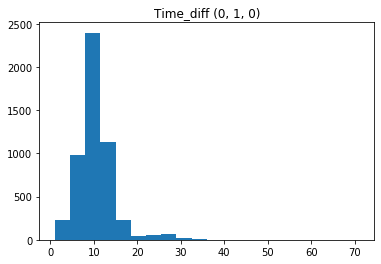

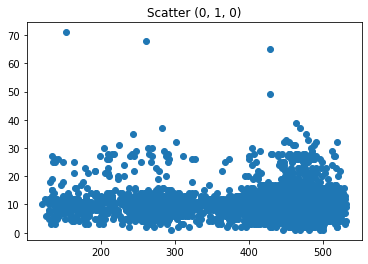

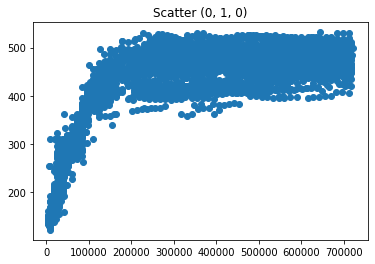

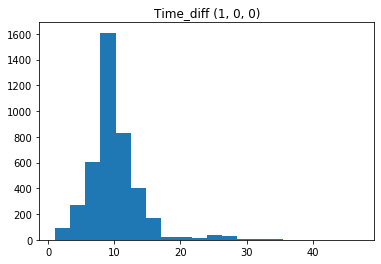

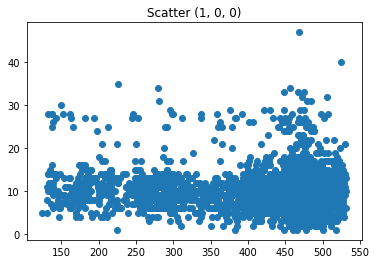

...

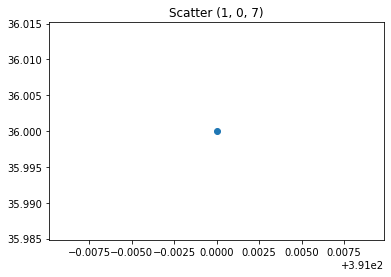

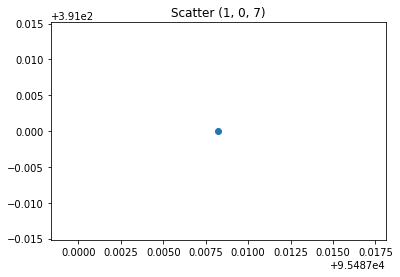

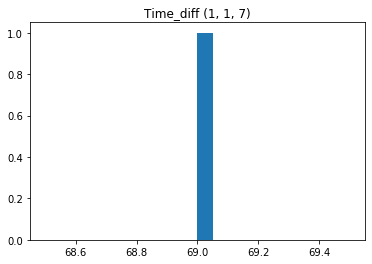

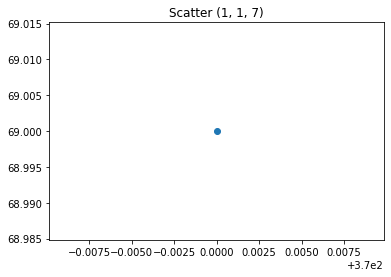

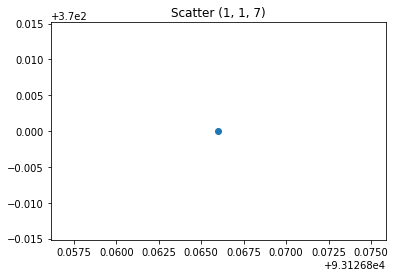

In [21]:
ts_diff = {}
distances = {}
speeds = {}
for i in range(starts_df.shape[0]):
    abs_x_diff = abs(starts_df['x'].iloc[i] - starts_df['last_x'].iloc[i])
    abs_y_diff = abs(starts_df['y'].iloc[i] - starts_df['last_y'].iloc[i])
    abs_z_diff = abs(starts_df['z'].iloc[i] - starts_df['last_z'].iloc[i])
    temp_ts_diff = starts_df['ts'].iloc[i] - starts_df['last_ts'].iloc[i]
    try:
        ts_diff[(abs_x_diff, abs_y_diff, abs_z_diff)] += [temp_ts_diff]
        distances[(abs_x_diff, abs_y_diff, abs_z_diff)] += [starts_df['dist_from_airport'].iloc[i]]
        speeds[(abs_x_diff, abs_y_diff, abs_z_diff)] += [starts_df['ground_speed'].iloc[i]]
    except:
        ts_diff[(abs_x_diff, abs_y_diff, abs_z_diff)] = [temp_ts_diff]
        distances[(abs_x_diff, abs_y_diff, abs_z_diff)] = [starts_df['dist_from_airport'].iloc[i]]
        speeds[(abs_x_diff, abs_y_diff, abs_z_diff)] = [starts_df['ground_speed'].iloc[i]]

for key in ts_diff.keys():
    plt.hist(x = ts_diff[key], bins = 20)
    plt.title("Time_diff " + str(key))
    plt.show()
    plt.scatter(x = speeds[key], y = ts_diff[key])
    plt.title("Scatter " + str(key))
    plt.show()
    plt.scatter(x = distances[key], y = speeds[key])
    plt.title("Scatter " + str(key))
    plt.show()

# Analyzing most frequent paths

- all_points corresponds to lon-lat-altitude
- all_points1 corresponds to lon-lat

In [20]:
all_points = {}
for i in range(landing_ac_data.shape[0]):
    x = landing_ac_data['last_x'].iloc[i]
    y = landing_ac_data['last_y'].iloc[i]
    z = landing_ac_data['last_z'].iloc[i]
    try:
        all_points[(x, y, z)] += 1
    except:
        all_points[(x, y, z)] = 1

all_points1 = {}
for i in range(landing_ac_data1.shape[0]):
    x = landing_ac_data1['last_x'].iloc[i]
    y = landing_ac_data1['last_y'].iloc[i]
    try:
        all_points1[(x, y)] += 1
    except:
        all_points1[(x, y)] = 1

point_lis = sorted(all_points.items(), key = lambda kv:(kv[1], kv[0]), reverse = True)
point_lis1 = sorted(all_points1.items(), key = lambda kv:(kv[1], kv[0]), reverse = True)

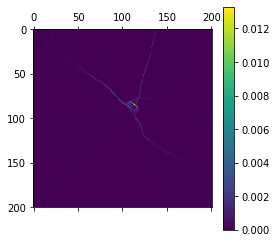

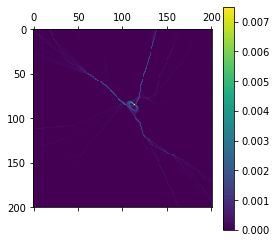

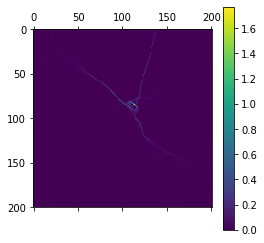

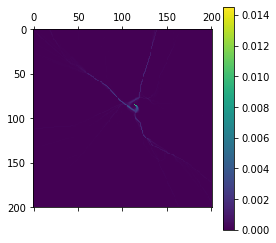

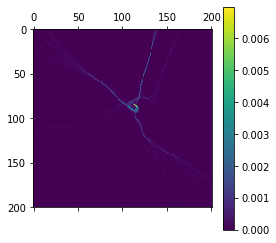

...

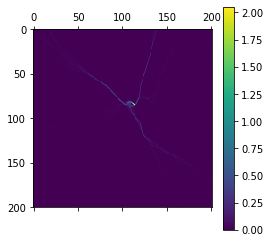

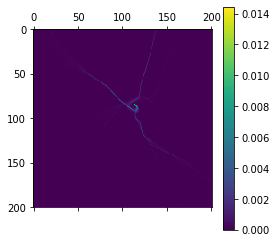

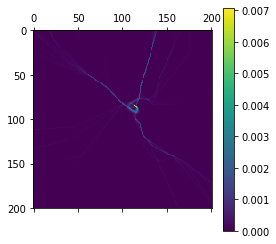

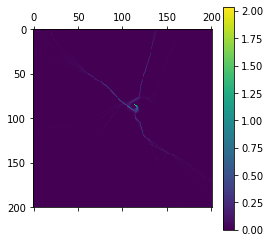

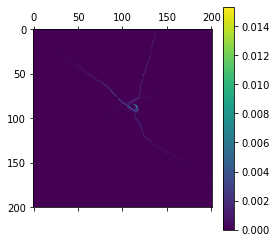

KeyboardInterrupt: 

In [21]:
def get_flow_matrix_through_point(point, with_altitude = True):
    matrix = np.zeros((x_max + 1, y_max + 1))
    if with_altitude:
        flow_df = landing_ac_data[(landing_ac_data['last_x'] == point[0]) &
                                (landing_ac_data['last_y'] == point[1]) &
                                (landing_ac_data['last_z'] == point[2])]
    else:
        flow_df = landing_ac_data[(landing_ac_data['last_x'] == point[0]) &
                                (landing_ac_data['last_y'] == point[1])]
    if flow_df.shape[0] > 0:
        flow_df = flow_df.reset_index(drop = False)[['id']]
        if with_altitude:
            flow_df = flow_df.merge(landing_ac_data, on = ['id'])
        else:
            flow_df = flow_df.merge(landing_ac_data1, on = ['id'])
        flow_df = flow_df.sort_values(['id', 'ts']).reset_index(drop = True)
        for i in range(flow_df.shape[0]):
            matrix[flow_df['x'].iloc[i], flow_df['y'].iloc[i]] += 1
    
    return matrix

for item in point_lis[0:10]:
    matrix = get_flow_matrix_through_point(item[0])
    plt.matshow(matrix/np.sum(matrix))
    plt.colorbar()
    plt.show()
    matrix1 = get_flow_matrix_through_point(item[0], with_altitude = False)
    plt.matshow(matrix1/np.sum(matrix1))
    plt.colorbar()
    plt.show()
    mat = (matrix/matrix.sum())/(matrix1[item[0][0], item[0][1]]/matrix1.sum() + 0.0000001)
    plt.matshow(mat)
    plt.colorbar()
    plt.show()

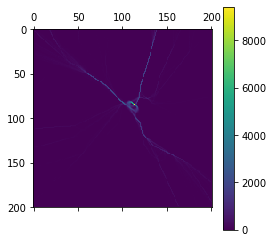

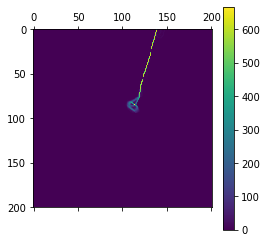

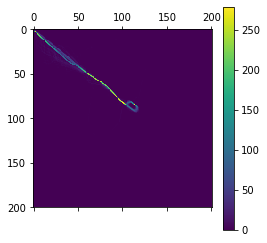

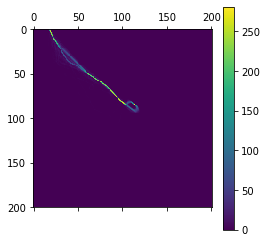

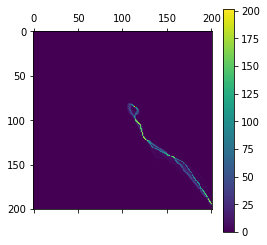

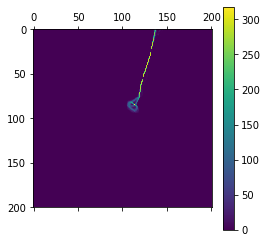

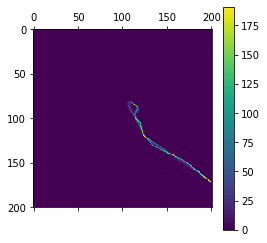

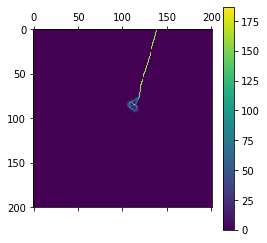

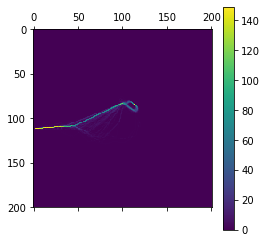

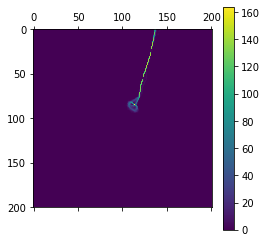

In [22]:
for item in lis1[0:10]:
    matrix = get_flow_matrix_through_point(item[0], with_altitude = False)
    plt.matshow(matrix)
    plt.colorbar()
    plt.show()

# Analyzing in discrete space and discrete time

In [15]:
landing_ac_data2 = flight_data[flight_data['jfk_landing_flag']]
landing_ac_data2 = landing_ac_data2.sort_values(['id', 'ts']).reset_index(drop = True)
landing_ac_data2['last_ts'] = landing_ac_data2[['id', 'ts']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data2['last_x'] = landing_ac_data2[['id', 'x']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data2['last_y'] = landing_ac_data2[['id', 'y']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data2['last_z'] = landing_ac_data2[['id', 'z']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data2['last_lon'] = landing_ac_data2[['id', 'lon']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data2['last_lat'] = landing_ac_data2[['id', 'lat']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data2['last_altitude'] = landing_ac_data2[['id', 'altitude']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
first_df = landing_ac_data2.groupby(['id']).first().reset_index(drop = False)
last_df = landing_ac_data2.groupby(['id']).last().reset_index(drop = False)
duration_df = pd.DataFrame({"id": first_df['id'], "total_duration": last_df['ts'] - first_df['last_ts']})

In [26]:
duration_df.head()

,id,total_duration
0,00B0EF_0,4374.0
1,00B0F1_0,3298.0
2,00B0F1_12,3807.0
3,00B0F1_3,3731.0
4,00B0F1_6,3504.0


/home/atc/anaconda3/envs/tf/lib/python3.7/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/atc/anaconda3/envs/tf/lib/python3.7/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


(array([3.000e+01, 2.400e+01, 1.700e+01, 3.100e+01, 3.700e+01, 3.100e+01,
        1.500e+01, 3.210e+02, 6.170e+02, 6.400e+02, 6.230e+02, 9.580e+02,
        1.289e+03, 1.016e+03, 4.640e+02, 2.030e+02, 8.600e+01, 5.000e+01,
        2.300e+01, 1.500e+01, 1.400e+01, 6.000e+00, 6.000e+00, 6.000e+00,
        2.000e+00, 6.000e+00, 2.000e+00, 3.000e+00, 1.000e+00, 0.000e+00,
        0.000e+00, 2.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([   12. ,   299.2,   586.4,   873.6,  1160.8,  1448. ,  1735.2,
         2022.4,  2309.6,  2596.8,  2884. ,  3171.2,  3458.4,  3745.6,
         4032.8,  4320. ,  4607.2,  4894.4,  5181.6,  5468.8,  5756. ,
         6043.2,  6330.4,  6617.6,  6904.8,  7192. ,  7479.2,  7766.4,
         8053.6,  8340.8,  8628. ,  8915.2,  9202.4,  9489.6,  9776.8,
        10064. , 10351.2, 10638.4, 10925.6, 11212.8, 11500. ]),
 <a list of 40 Patch objects>)

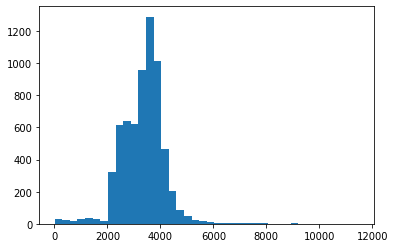

In [27]:
plt.hist(duration_df['total_duration'], bins = 40)
# Requires cleanup of aircraft that existed at the beginning and end of code run

(array([502., 162., 403., 351., 244.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0., 306., 575., 340.,   0., 161., 516.,
        515., 465., 449., 515., 569., 428.,  39.]),
 array([1.55870794e+09, 1.55877511e+09, 1.55884229e+09, 1.55890946e+09,
        1.55897664e+09, 1.55904382e+09, 1.55911099e+09, 1.55917817e+09,
        1.55924534e+09, 1.55931252e+09, 1.55937970e+09, 1.55944687e+09,
        1.55951405e+09, 1.55958122e+09, 1.55964840e+09, 1.55971558e+09,
        1.55978275e+09, 1.55984993e+09, 1.55991711e+09, 1.55998428e+09,
        1.56005146e+09, 1.56011863e+09, 1.56018581e+09, 1.56025299e+09,
        1.56032016e+09, 1.56038734e+09, 1.56045451e+09, 1.56052169e+09,
        1.56058887e+09, 1.56065604e+09, 1.56072322e+09, 1.56079039e+09,
        1.56085757e+09, 1.56092475e+09, 1.56099192e+09, 1.56105910e+09,
        1.56112627e+09, 1.56119345e+09, 1.56126063e+09, 1.56132780e+09,
      

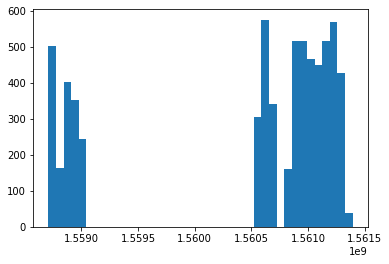

In [28]:
# Invalid
plt.hist(first_df['last_ts'], bins = 40)

(array([80., 81., 80., 74., 67., 58., 32.,  2., 19., 54., 34.,  5.,  0.,
         0.,  0.,  0., 45., 30.,  9.,  5., 26., 39., 34., 49., 74., 82.,
        66., 60., 57., 29., 10.,  4., 34., 39., 43., 61., 80., 66., 76.,
        58.]),
 array([1.55870794e+09, 1.55871530e+09, 1.55872266e+09, 1.55873002e+09,
        1.55873739e+09, 1.55874475e+09, 1.55875211e+09, 1.55875947e+09,
        1.55876684e+09, 1.55877420e+09, 1.55878156e+09, 1.55878892e+09,
        1.55879629e+09, 1.55880365e+09, 1.55881101e+09, 1.55881837e+09,
        1.55882573e+09, 1.55883310e+09, 1.55884046e+09, 1.55884782e+09,
        1.55885518e+09, 1.55886255e+09, 1.55886991e+09, 1.55887727e+09,
        1.55888463e+09, 1.55889200e+09, 1.55889936e+09, 1.55890672e+09,
        1.55891408e+09, 1.55892145e+09, 1.55892881e+09, 1.55893617e+09,
        1.55894353e+09, 1.55895090e+09, 1.55895826e+09, 1.55896562e+09,
        1.55897298e+09, 1.55898035e+09, 1.55898771e+09, 1.55899507e+09,
        1.55900243e+09]),
 <a list of 40 Patch

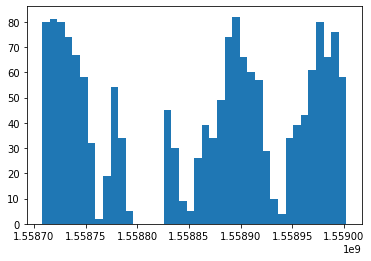

In [29]:
# Invalid
plt.hist(first_df['last_ts'][first_df['last_ts'] < 1559500000], bins = 40)

(array([28., 20., 17., 23., 30., 17., 26., 27., 26., 18., 19., 21., 20.,
        23., 18., 20., 24., 14., 20., 15., 13., 12., 12.,  6.,  3.,  0.,
         0.,  2.,  1.,  3.,  7., 18., 11., 17., 16., 11.,  8., 12.,  6.,
         2.]),
 array([1.55870794e+09, 1.55871004e+09, 1.55871214e+09, 1.55871424e+09,
        1.55871634e+09, 1.55871844e+09, 1.55872054e+09, 1.55872264e+09,
        1.55872474e+09, 1.55872684e+09, 1.55872894e+09, 1.55873104e+09,
        1.55873314e+09, 1.55873524e+09, 1.55873734e+09, 1.55873944e+09,
        1.55874154e+09, 1.55874364e+09, 1.55874574e+09, 1.55874785e+09,
        1.55874995e+09, 1.55875205e+09, 1.55875415e+09, 1.55875625e+09,
        1.55875835e+09, 1.55876045e+09, 1.55876255e+09, 1.55876465e+09,
        1.55876675e+09, 1.55876885e+09, 1.55877095e+09, 1.55877305e+09,
        1.55877515e+09, 1.55877725e+09, 1.55877935e+09, 1.55878145e+09,
        1.55878355e+09, 1.55878565e+09, 1.55878776e+09, 1.55878986e+09,
        1.55879196e+09]),
 <a list of 40 Patch

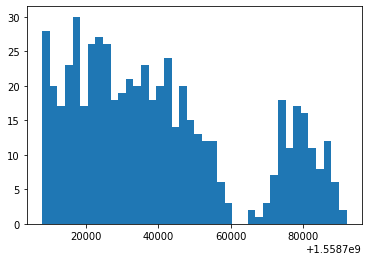

In [30]:
# Invalid
plt.hist(first_df['last_ts'][first_df['last_ts'] < 1558800000], bins = 40)

(array([63., 20., 15.,  5.,  3.,  4., 19., 24., 30., 18., 25., 25., 39.,
        42., 56., 47., 35., 39., 37., 34., 38., 20., 20.,  6.,  3.,  4.,
        17., 21., 29., 25., 29., 26., 43., 43., 54., 48., 32., 46., 43.,
        24.]),
 array([1.55882998e+09, 1.55883430e+09, 1.55883861e+09, 1.55884292e+09,
        1.55884723e+09, 1.55885154e+09, 1.55885585e+09, 1.55886016e+09,
        1.55886447e+09, 1.55886879e+09, 1.55887310e+09, 1.55887741e+09,
        1.55888172e+09, 1.55888603e+09, 1.55889034e+09, 1.55889465e+09,
        1.55889896e+09, 1.55890328e+09, 1.55890759e+09, 1.55891190e+09,
        1.55891621e+09, 1.55892052e+09, 1.55892483e+09, 1.55892914e+09,
        1.55893345e+09, 1.55893776e+09, 1.55894208e+09, 1.55894639e+09,
        1.55895070e+09, 1.55895501e+09, 1.55895932e+09, 1.55896363e+09,
        1.55896794e+09, 1.55897225e+09, 1.55897657e+09, 1.55898088e+09,
        1.55898519e+09, 1.55898950e+09, 1.55899381e+09, 1.55899812e+09,
        1.55900243e+09]),
 <a list of 40 Patch

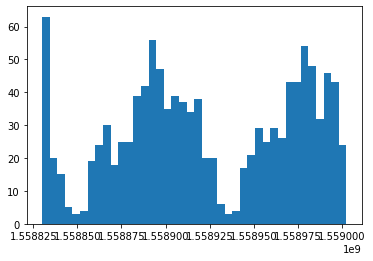

In [16]:
# Valid
condition1 = (first_df['last_ts'] >= 1558800000) & (first_df['last_ts'] < 1559500000)
plt.hist(first_df['last_ts'][condition1], bins = 40)

(array([237.,  51., 156., 209., 196.,  44., 137., 189.,   2.,   0.,   0.,
          0.,   0.,  73., 124., 189., 191., 101., 127., 191., 181., 132.,
        113., 187., 199., 136., 116., 182., 226., 124., 103., 175., 217.,
        116.,  84., 168., 182.,  19.,   0.,   1.]),
 array([1.56054354e+09, 1.56056483e+09, 1.56058611e+09, 1.56060740e+09,
        1.56062869e+09, 1.56064997e+09, 1.56067126e+09, 1.56069254e+09,
        1.56071383e+09, 1.56073512e+09, 1.56075640e+09, 1.56077769e+09,
        1.56079897e+09, 1.56082026e+09, 1.56084155e+09, 1.56086283e+09,
        1.56088412e+09, 1.56090540e+09, 1.56092669e+09, 1.56094798e+09,
        1.56096926e+09, 1.56099055e+09, 1.56101183e+09, 1.56103312e+09,
        1.56105440e+09, 1.56107569e+09, 1.56109698e+09, 1.56111826e+09,
        1.56113955e+09, 1.56116083e+09, 1.56118212e+09, 1.56120341e+09,
        1.56122469e+09, 1.56124598e+09, 1.56126726e+09, 1.56128855e+09,
        1.56130984e+09, 1.56133112e+09, 1.56135241e+09, 1.56137369e+09,
      

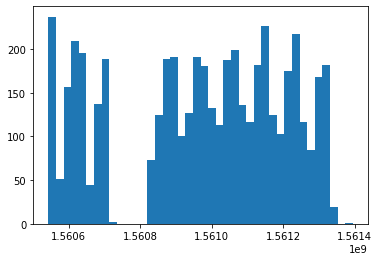

In [32]:
# Invalid
plt.hist(first_df['last_ts'][(first_df['last_ts'] >= 1559500000)], bins = 40)

(array([79., 42., 45., 37., 39., 26., 13.,  1.,  3.,  8., 29., 35., 30.,
        29., 27., 29., 43., 54., 44., 48., 43., 47., 40., 38., 28., 26.,
        11.,  1.,  4.,  9., 23., 36., 28., 23., 34., 29., 40., 55., 37.,
        15.]),
 array([1.56054354e+09, 1.56054785e+09, 1.56055216e+09, 1.56055646e+09,
        1.56056077e+09, 1.56056508e+09, 1.56056939e+09, 1.56057369e+09,
        1.56057800e+09, 1.56058231e+09, 1.56058661e+09, 1.56059092e+09,
        1.56059523e+09, 1.56059954e+09, 1.56060384e+09, 1.56060815e+09,
        1.56061246e+09, 1.56061676e+09, 1.56062107e+09, 1.56062538e+09,
        1.56062969e+09, 1.56063399e+09, 1.56063830e+09, 1.56064261e+09,
        1.56064691e+09, 1.56065122e+09, 1.56065553e+09, 1.56065984e+09,
        1.56066414e+09, 1.56066845e+09, 1.56067276e+09, 1.56067706e+09,
        1.56068137e+09, 1.56068568e+09, 1.56068999e+09, 1.56069429e+09,
        1.56069860e+09, 1.56070291e+09, 1.56070721e+09, 1.56071152e+09,
        1.56071583e+09]),
 <a list of 40 Patch

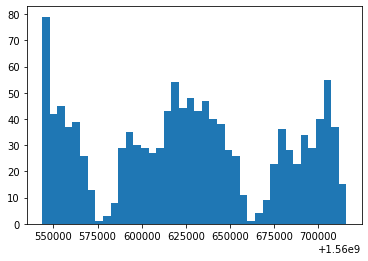

In [17]:
# Valid
condition2 = (first_df['last_ts'] >= 1559500000) & (first_df['last_ts'] < 1560800000)
plt.hist(first_df['last_ts'][condition2], bins = 40)

(array([ 83.,  28., 101.,  98., 131., 121., 110.,  39.,  62.,  89., 111.,
        126., 101., 114.,  21.,  75.,  99., 130., 116., 116.,  88.,  29.,
         91.,  97., 145., 129., 114.,  41.,  57.,  87., 116., 141., 129.,
         89.,  13.,  74.,  88., 133., 114.,  48.]),
 array([1.56082224e+09, 1.56083517e+09, 1.56084810e+09, 1.56086103e+09,
        1.56087396e+09, 1.56088689e+09, 1.56089982e+09, 1.56091275e+09,
        1.56092567e+09, 1.56093860e+09, 1.56095153e+09, 1.56096446e+09,
        1.56097739e+09, 1.56099032e+09, 1.56100325e+09, 1.56101618e+09,
        1.56102911e+09, 1.56104204e+09, 1.56105496e+09, 1.56106789e+09,
        1.56108082e+09, 1.56109375e+09, 1.56110668e+09, 1.56111961e+09,
        1.56113254e+09, 1.56114547e+09, 1.56115840e+09, 1.56117133e+09,
        1.56118426e+09, 1.56119718e+09, 1.56121011e+09, 1.56122304e+09,
        1.56123597e+09, 1.56124890e+09, 1.56126183e+09, 1.56127476e+09,
        1.56128769e+09, 1.56130062e+09, 1.56131355e+09, 1.56132647e+09,
      

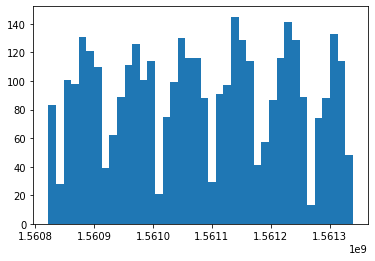

In [18]:
# Valid
condition3 = (first_df['last_ts'] >= 1560800000)
plt.hist(first_df['last_ts'][condition3], bins = 40)

In [19]:
def end_correction(first_df, condition, ts_remove = 3600):
    ac_to_remove = first_df[condition]
    start_time_to_remove = ac_to_remove['last_ts'].min()
    end_time_to_remove = start_time_to_remove + ts_remove
    first_df = first_df[first_df['last_ts'] > end_time_to_remove]
    end_time_to_remove = ac_to_remove['ts'].max()
    start_time_to_remove = end_time_to_remove - ts_remove
    first_df = first_df[first_df['ts'] < start_time_to_remove]
    return first_df

first_df1 = end_correction(first_df, condition1)
first_df2 = end_correction(first_df, condition2)
first_df3 = end_correction(first_df, condition3)
print(first_df.shape)
print(first_df1.shape)
print(first_df2.shape)
print(first_df3.shape)

(6676, 23)
(1075, 23)
(1144, 23)
(3648, 23)


In [20]:
first_df = pd.concat([first_df1, first_df2, first_df3], axis = 0)

In [21]:
first_df.shape

(5867, 23)

In [22]:
landing_ac_data2 = first_df[['id']]
landing_ac_data2 = landing_ac_data2.merge(landing_ac_data)
landing_ac_data2 = landing_ac_data2.sort_values(['id', 'ts']).reset_index(drop = True)
landing_ac_data2.shape

(793004, 23)

(array([ 13.,   5.,   6.,   4.,   7.,   8.,  12.,  10.,  15.,   6.,   4.,
          7.,  40., 179., 305., 318., 368., 359., 348., 393., 511., 598.,
        666., 595., 445., 268., 139.,  83.,  41.,  30.,  23.,  18.,  13.,
          2.,   3.,   3.,   6.,   1.,   1.,   2.]),
 array([5.000000e+00, 1.643750e+02, 3.237500e+02, 4.831250e+02,
        6.425000e+02, 8.018750e+02, 9.612500e+02, 1.120625e+03,
        1.280000e+03, 1.439375e+03, 1.598750e+03, 1.758125e+03,
        1.917500e+03, 2.076875e+03, 2.236250e+03, 2.395625e+03,
        2.555000e+03, 2.714375e+03, 2.873750e+03, 3.033125e+03,
        3.192500e+03, 3.351875e+03, 3.511250e+03, 3.670625e+03,
        3.830000e+03, 3.989375e+03, 4.148750e+03, 4.308125e+03,
        4.467500e+03, 4.626875e+03, 4.786250e+03, 4.945625e+03,
        5.105000e+03, 5.264375e+03, 5.423750e+03, 5.583125e+03,
        5.742500e+03, 5.901875e+03, 6.061250e+03, 6.220625e+03,
        6.380000e+03]),
 <a list of 40 Patch objects>)

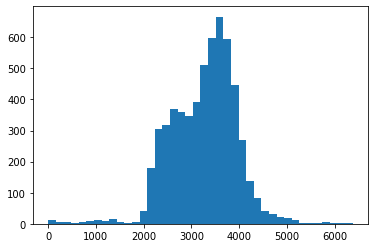

In [23]:
first_df = landing_ac_data2.groupby(['id']).first().reset_index(drop = False)
last_df = landing_ac_data2.groupby(['id']).last().reset_index(drop = False)
duration_df = pd.DataFrame({"id": first_df['id'], "total_duration": last_df['ts'] - first_df['last_ts']})
plt.hist(duration_df['total_duration'], bins = 40)

In [24]:
duration_df = duration_df[duration_df['total_duration'] >= 1800] # Removing aircraft with very short duration
landing_ac_data2 = landing_ac_data2.merge(duration_df)
print(landing_ac_data2.shape)
first_df = landing_ac_data2.groupby(['id']).first().reset_index(drop = False)[['id', 'last_ts']]
first_df.columns = ['id', 'start_ts']
landing_ac_data2 = landing_ac_data2.merge(first_df)
landing_ac_data2.shape

(790063, 24)


(790063, 25)

### Discretizing time (minutes from start of observation)

In [25]:
landing_ac_data2['t'] = ((landing_ac_data2['ts'] - landing_ac_data2['start_ts'])/60).apply(np.ceil).apply(int)
landing_ac_data2['last_t'] = ((landing_ac_data2['last_ts'] - landing_ac_data2['start_ts'])/60).apply(np.ceil).apply(int)
print(landing_ac_data2['t'].min())
print(landing_ac_data2['t'].max())

1
107


In [26]:
print(landing_ac_data2.shape)
landing_ac_data2 = landing_ac_data2[(landing_ac_data2['x'] != landing_ac_data2['last_x']) |
                                   (landing_ac_data2['y'] != landing_ac_data2['last_y']) |
                                   (landing_ac_data2['t'] != landing_ac_data2['last_t'])]
print(landing_ac_data2.shape)

(790063, 27)
(521218, 27)


In [27]:
transitions2 = {}

for i in range(landing_ac_data2.shape[0]):
    last_x = landing_ac_data2['last_x'].iloc[i]
    last_y = landing_ac_data2['last_y'].iloc[i]
    last_t = landing_ac_data2['last_t'].iloc[i]
    x = landing_ac_data2['x'].iloc[i]
    y = landing_ac_data2['y'].iloc[i]
    t = landing_ac_data2['t'].iloc[i]
    try:
        transitions2[(last_x, last_y, last_t)][(x, y, t)] += 1
    except:
        try:
            transitions2[(last_x, last_y, last_t)][(x, y, t)] = 1
        except:
            transitions2[(last_x, last_y, last_t)] = {(x, y, t): 1}

transitions2[list(transitions2.keys())[0]]

{(100, 8, 1): 1}

In [28]:
start_point2 = landing_ac_data2.groupby(['id']).first().reset_index(drop = False)
starts2 = {}
for i in range(start_point2.shape[0]):
    x = start_point2['last_x'].iloc[i]
    y = start_point2['last_y'].iloc[i]
    t = start_point2['last_t'].iloc[i]
    try:
        starts2[(x,y,t)] += 1
    except:
        starts2[(x,y,t)] = 1

print(len(starts2.keys()))
lis2 = sorted(starts2.items(), key = lambda kv:(kv[1], kv[0]), reverse = True)

439


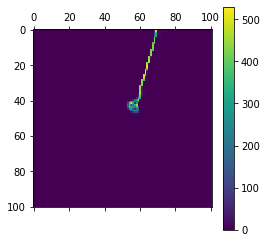

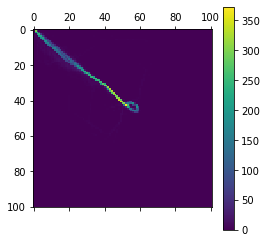

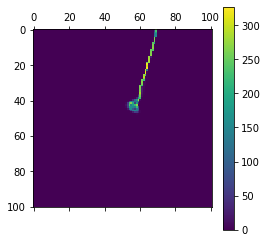

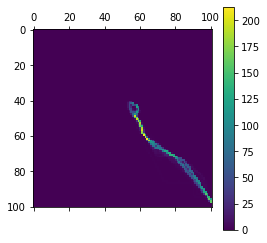

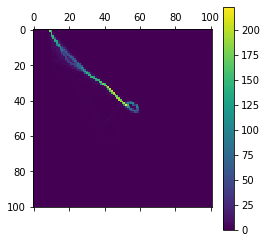

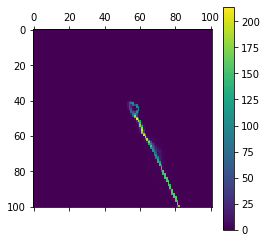

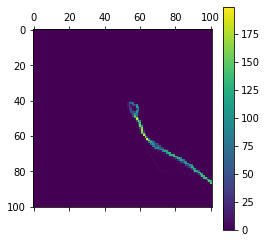

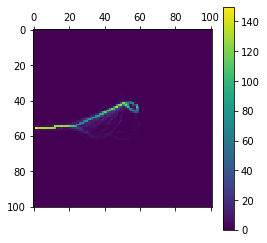

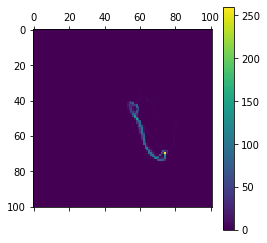

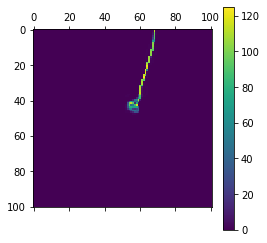

In [47]:
def get_flow_matrix_time(item):
    matrix = np.zeros((101, 101, 108))
    time_df = start_point2[(start_point2['last_x'] == item[0]) &
                          (start_point2['last_y'] == item[1]) &
                          (start_point2['last_t'] == item[2])]
    time_df = time_df[['id']]
    time_df = landing_ac_data2.merge(time_df)
    time_df = time_df.sort_values(['id', 'ts']).reset_index(drop = True)
    for i in range(time_df.shape[0]):
        x = time_df['last_x'].iloc[i]
        y = time_df['last_y'].iloc[i]
        t = time_df['last_t'].iloc[i]
        matrix[x, y, t] += 1
    
    return matrix

for item in lis2[0:10]:
    matrix = get_flow_matrix_time(item[0])
    matrix = np.sum(matrix, axis = 2)
    plt.matshow(matrix)
    plt.colorbar()
    plt.savefig("Transitions/lon_lat_discretized_count_" + str(item[0]) + "_with_time.png", dpi = 199)
    plt.show()

## Analyzing the take-off and landing from nearby airport

- The graph seems to show unusual deviation from expected behavior
- Many aircraft seem to spend more time at the airport before taking off

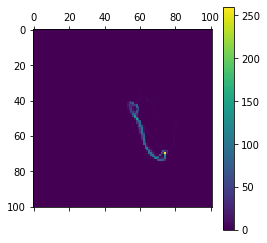

(120, 27)

In [31]:
item = lis2[8]
matrix = get_flow_matrix_time(item[0])
matrix = np.sum(matrix, axis = 2)
plt.matshow(matrix)
plt.colorbar()
plt.savefig("Transitions/lon_lat_discretized_count_" + str(item[0]) + "_with_time.png", dpi = 199)
plt.show()
df = start_point2[(start_point2['last_x'] == item[0][0]) &
                 (start_point2['last_y'] == item[0][1]) &
                 (start_point2['last_t'] == item[0][2])]
df.shape
# Counts look diffused over time

(array([ 4.,  1., 10., 10.,  7., 10.,  5., 14., 12.,  8.,  9.,  5.,  3.,
         4.,  4.,  3.,  5.,  2.,  0.,  0.,  0.,  1.,  1.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,
         1.]),
 array([2328.   , 2391.125, 2454.25 , 2517.375, 2580.5  , 2643.625,
        2706.75 , 2769.875, 2833.   , 2896.125, 2959.25 , 3022.375,
        3085.5  , 3148.625, 3211.75 , 3274.875, 3338.   , 3401.125,
        3464.25 , 3527.375, 3590.5  , 3653.625, 3716.75 , 3779.875,
        3843.   , 3906.125, 3969.25 , 4032.375, 4095.5  , 4158.625,
        4221.75 , 4284.875, 4348.   , 4411.125, 4474.25 , 4537.375,
        4600.5  , 4663.625, 4726.75 , 4789.875, 4853.   ]),
 <a list of 40 Patch objects>)

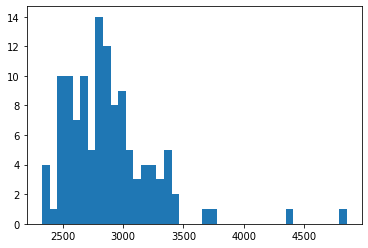

In [32]:
df1 = df.merge(duration_df)
plt.hist(df1['total_duration'], bins = 40)
# Unexpectedly non-uniform behavior

## Removing takeoff delay at airport

In short, analyzing from takeoff to landing only

In [33]:
df1 = start_point2[(start_point2['last_x'] == item[0][0]) &
                 (start_point2['last_y'] == item[0][1]) &
                 (start_point2['last_t'] == item[0][2])][['id']]

landing_ac_data3 = flight_data[flight_data['jfk_landing_flag']]
landing_ac_data3 = landing_ac_data3.merge(df1)
landing_ac_data3 = landing_ac_data3.sort_values(['id', 'ts']).reset_index(drop = True)
# Discretizing z to have 100ft width instead of 500ft width
landing_ac_data3['z'] = (landing_ac_data3['altitude']/100).apply(np.ceil)
landing_ac_data3['last_ts'] = landing_ac_data3[['id', 'ts']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data3['last_x'] = landing_ac_data3[['id', 'x']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data3['last_y'] = landing_ac_data3[['id', 'y']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data3['last_z'] = landing_ac_data3[['id', 'z']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
landing_ac_data3 = landing_ac_data3[~landing_ac_data3['last_ts'].apply(np.isnan)].reset_index(drop = True)
landing_ac_data3['x'] = landing_ac_data3['x'].apply(int)
landing_ac_data3['y'] = landing_ac_data3['y'].apply(int)
landing_ac_data3['z'] = landing_ac_data3['z'].apply(int)
landing_ac_data3['last_x'] = landing_ac_data3['last_x'].apply(int)
landing_ac_data3['last_y'] = landing_ac_data3['last_y'].apply(int)
landing_ac_data3['last_z'] = landing_ac_data3['last_z'].apply(int)
landing_ac_data3 = landing_ac_data3.sort_values(['id', 'ts']).reset_index(drop = True)
landing_ac_data3 = landing_ac_data3[(landing_ac_data3['x'] != landing_ac_data3['last_x']) |
                                   (landing_ac_data3['y'] != landing_ac_data3['last_y']) |
                                   (landing_ac_data3['z'] != landing_ac_data3['last_z'])]

# # Recording the first instance of lon, lat or altitude change
# landing_ac_data4 = landing_ac_data3[(landing_ac_data3['x'] != landing_ac_data3['last_x']) |
#                                    (landing_ac_data3['y'] != landing_ac_data3['last_y']) |
#                                    (landing_ac_data3['z'] != landing_ac_data3['last_z'])].groupby(['id']).first().reset_index(drop = False)
# landing_ac_data4 = landing_ac_data4.merge(df1)
# landing_ac_data4.head()

In [51]:
# print(landing_ac_data4['source'].value_counts())
# print(landing_ac_data4['destination'].value_counts())
# print(landing_ac_data4['last_x'].value_counts())
# print(landing_ac_data4['last_y'].value_counts())
# print(landing_ac_data4['x'].value_counts())
# print(landing_ac_data4['y'].value_counts())
# print(item)
# The airport is BOS!

(array([ 4.,  1.,  5., 12.,  7., 10.,  7., 10., 14., 10.,  9.,  4.,  3.,
         3.,  6.,  2.,  6.,  2.,  1.,  0.,  0.,  1.,  1.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,
         1.]),
 array([2328.   , 2391.125, 2454.25 , 2517.375, 2580.5  , 2643.625,
        2706.75 , 2769.875, 2833.   , 2896.125, 2959.25 , 3022.375,
        3085.5  , 3148.625, 3211.75 , 3274.875, 3338.   , 3401.125,
        3464.25 , 3527.375, 3590.5  , 3653.625, 3716.75 , 3779.875,
        3843.   , 3906.125, 3969.25 , 4032.375, 4095.5  , 4158.625,
        4221.75 , 4284.875, 4348.   , 4411.125, 4474.25 , 4537.375,
        4600.5  , 4663.625, 4726.75 , 4789.875, 4853.   ]),
 <a list of 40 Patch objects>)

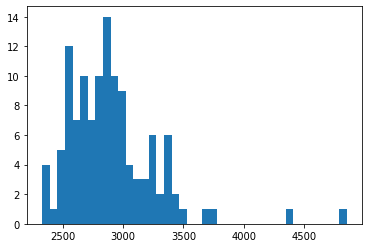

In [34]:
# first_ts_df = landing_ac_data3[['id', 'last_ts']].groupby(['id']).first().reset_index(drop = False)
# first_ts_df.columns = ['id', 'id_start_ts']
# landing_ac_data3 = landing_ac_data3.merge(first_ts_df)
# landing_ac_data3 = landing_ac_data3.sort_values(['id', 'ts']).reset_index(drop = True)
first_df = landing_ac_data3[['id', 'last_ts']].groupby(['id']).first().reset_index(drop = False)
first_df = first_df.sort_values(['id']).reset_index(drop = True)
last_df = landing_ac_data3[['id', 'ts']].groupby(['id']).last().reset_index(drop = False)
last_df = last_df.sort_values(['id']).reset_index(drop = True)
duration_df = pd.DataFrame({"id": first_df['id'], "total_duration": last_df['ts'] - first_df['last_ts']})
plt.hist(duration_df['total_duration'], bins = 40)

In [35]:
first_df.columns = ['id', 'id_start_ts']
landing_ac_data3 = landing_ac_data3.merge(first_df)
landing_ac_data3 = landing_ac_data3.sort_values(['id', 'ts']).reset_index(drop = True)
landing_ac_data3['t'] = ((landing_ac_data3['ts'] - landing_ac_data3['id_start_ts'])/60).apply(np.ceil).apply(int)
landing_ac_data3['last_t'] = ((landing_ac_data3['last_ts'] - landing_ac_data3['id_start_ts'])/60).apply(np.ceil).apply(int)

start_point3 = landing_ac_data3.groupby(['id']).first().reset_index(drop = False)

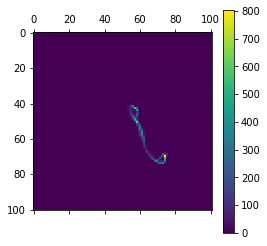

In [36]:
def get_flow_matrix_time_new(item):
    matrix = np.zeros((101, 101, 108))
    time_df = start_point3[(start_point3['last_x'] == item[0]) &
                          (start_point3['last_y'] == item[1]) &
                          (start_point3['last_t'] == item[2])]
    time_df = time_df[['id']]
    time_df = landing_ac_data3.merge(time_df)
    time_df = time_df.sort_values(['id', 'ts']).reset_index(drop = True)
    for i in range(time_df.shape[0]):
        x = time_df['last_x'].iloc[i]
        y = time_df['last_y'].iloc[i]
        t = time_df['last_t'].iloc[i]
        matrix[x, y, t] += 1
    
    return matrix

matrix = get_flow_matrix_time_new(item[0])
matrix = np.sum(matrix, axis = 2)
plt.matshow(matrix)
plt.colorbar()
plt.savefig("Transitions/lon_lat_discretized_count_" + str(item[0]) + "_with_adjusted_time.png", dpi = 199)
plt.show()
# Shows that most aircraft follow some takeoff-landing schedule closely

In [37]:
landing_ac_data2.head()

,id,aircraft,lat,lon,ts,altitude,climb_rate,azimuth,ground_speed,jfk_landing_flag,...,last_x,last_y,last_z,last_lon,last_lat,last_altitude,total_duration,start_ts,t,last_t
0,00B0EF_0,00B0EF,35.7080,-68.0000,1558950508,40000,0,314,410,True,...,100,7,80,-68.0000,35.6550,40000.0,4346.0,1.558950e+09,1,0
1,00B0EF_0,00B0EF,35.8114,-68.0298,1558950593,40000,0,319,410,True,...,100,8,80,-68.0141,35.7968,40000.0,4346.0,1.558950e+09,3,2
2,00B0EF_0,00B0EF,35.8844,-68.1081,1558950653,40000,0,319,410,True,...,100,9,80,-68.0924,35.8698,40000.0,4346.0,1.558950e+09,4,3
3,00B0EF_0,00B0EF,35.9136,-68.1394,1558950677,40000,0,319,410,True,...,99,9,80,-68.1238,35.8990,40000.0,4346.0,1.558950e+09,4,4
4,00B0EF_0,00B0EF,35.9721,-68.2021,1558950725,40000,0,319,410,True,...,99,10,80,-68.1865,35.9575,40000.0,4346.0,1.558950e+09,5,5


# Detecting potential collisions

In [29]:
first_df = flight_data[['id', 'ts']].groupby(['id']).first().reset_index(drop = False)
last_df = flight_data[['id', 'ts']].groupby(['id']).last().reset_index(drop = False)
first_df.columns = ['id', 'id_start_ts']
last_df.columns = ['id', 'id_end_ts']

In [30]:
# Multiprocess this!

landing_ac_data2 = landing_ac_data2.merge(first_df)
landing_ac_data2 = landing_ac_data2.merge(last_df)

dist_thr = 3 * 5556 # 2 * 3NM * 1.5 (FoS)
min_alt_separation = 1000

uniq_id = landing_ac_data2['id'].unique()

import math
from geopy import distance as distnc
import geopy

def get_bearing(lat1,lon1,lat2,lon2):
    dLon = lon2 - lon1
    y = math.sin(dLon) * math.cos(lat2)
    x = math.cos(lat1)*math.sin(lat2) - math.sin(lat1)*math.cos(lat2)*math.cos(dLon)
    brng = np.rad2deg(math.atan2(y, x))
    if brng < 0: brng+= 360
    return brng

def geo_destination(point, distance, bearing):
    point = geopy.Point(point)
    d = distnc.distance(meters = distance)
    dest = d.destination(point = point, bearing = bearing)
    return (dest[0], dest[1])

def get_conflict_df(uniq_id):
    conflict_df = pd.DataFrame([])
    for ac1 in uniq_id:
        ac1_df = landing_ac_data2[landing_ac_data2['id'] == ac1]
        min_ts = ac1_df['last_ts'].iloc[0]
        max_ts = ac1_df['ts'].iloc[ac1_df.shape[0] - 1]
        other_ac_df = flight_data[(flight_data['id'] != ac1) &
                                  (((flight_data['id_start_ts'] <= min_ts) & (flight_data['id_end_ts'] >= min_ts)) |
                                   ((flight_data['id_start_ts'] >= min_ts) & (flight_data['id_end_ts'] <= max_ts)) |
                                   ((flight_data['id_start_ts'] <= max_ts) & (flight_data['id_end_ts'] >= max_ts)))]
#         other_ac_df['ts_overlap'] = ((other_ac_df['ts'] >= min_ts) & (other_ac_df['ts'] <= max_ts))
#         other_ac_df = other_ac_df.groupby(['id']).ts_overlap.sum().reset_index(drop = False)
#         other_ac_df = other_ac_df[other_ac_df['ts_overlap'] > 0]
#         other_ac_df = other_ac_df[['id']].merge(landing_ac_data2[landing_ac_data2['id'] != ac1])
        other_ac_df = other_ac_df.sort_values(['id', 'ts']).reset_index(drop = True)
        prev_dists = []
        prev_closest = []
        min_lat_lon_dist = []
        min_alt_dist = []
        reqd_ac = []
        for i in range(ac1_df.shape[0]):
#             env_ts_df = other_ac_df[(other_ac_df['id_start_ts'] <= ac1_df.ts.iloc[i]) &
#                                     (other_ac_df['id_end_ts'] >= ac1_df.ts.iloc[i])]
#             env_ts_df = env_ts_df.sort_values(['id', 'ts']).reset_index(drop = True)
            env_ts_df = other_ac_df[other_ac_df['ts'] <= ac1_df['ts'].iloc[i]]
            if env_ts_df.shape[0] > 0:
                env_ts_df = env_ts_df.groupby(['id']).tail(2).reset_index(drop = False)
                env_ts_df['last_lon'] = env_ts_df[['id', 'lon']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
                env_ts_df['last_lat'] = env_ts_df[['id', 'lat']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
                env_ts_df = env_ts_df.groupby(['id']).last().reset_index(drop = False)
#                 env_ts_df['bearing'] = env_ts_df.apply(lambda x: get_bearing(lat1 = x['last_lat'], lon1 = x['last_lon'], lat2 = x['lat'], lon2 = x['lon']), axis = 1)
                env_ts_df['ts_diff'] = ac1_df['ts'].iloc[i] - env_ts_df['ts']
                env_ts_df['ground_distance'] = env_ts_df['ts_diff'] * env_ts_df['ground_speed'] * 4.63/9 # knots to m/s
                env_ts_df['lat_lon'] = env_ts_df.apply(lambda x: geo_destination((x['lat'], x['lon']), x['ground_distance'], x['azimuth']), axis = 1)
#                 env_ts_df['lat_lon'] = env_ts_df.apply(lambda x: (x['lat'], x['lon']), axis = 1)
                dists = env_ts_df['lat_lon'].apply(lambda x: distance.distance((ac1_df['lat'].iloc[i], ac1_df['lon'].iloc[i]), x).m)
                env_ts_df['altitude'] = env_ts_df['altitude'] + env_ts_df['climb_rate'] * env_ts_df['ts_diff']/60
                alts = env_ts_df['altitude']
                lats = env_ts_df['lat']
                lons = env_ts_df['lon']
                ts = env_ts_df['ts']
                ts.index = alts.index = dists.index = lats.index = lons.index = env_ts_df['id']    
                min_lat_lon_dist += [dists.min()]
                alt_condition = ((env_ts_df['altitude'] - ac1_df['altitude'].iloc[i]).apply(np.abs) <= min_alt_separation)
                if alt_condition.sum() > 0:
                    min_alt_dist += [dists[dists.index[alt_condition]].min()]
                else:
                    min_alt_dist += [np.nan]
                if len(prev_dists) != 0:
                    common = list(set(dists.index).intersection(set(prev_dists.index)))
                    rate = dists[common] - prev_dists[common]
                    dist_thr_index = dists.index[dists <= dist_thr]
                    idxs = set(common).intersection(set(dist_thr_index))
                    reqd_ac += [{(ac1, idx): (ac1_df['ts'].iloc[i], ac1_df['altitude'].iloc[i], ts[idx], alts[idx], dists[idx]) for idx in idxs}]
                    df = {"ac1_id": [], "ts": [], "ac1_lat": [], "ac1_lon": [], "ac1_altitude": [], "ac2_id": [], "ac2_lat": [], "ac2_lon": [], "ac2_altitude": [], "lat_lon_distance": []}
                    for idx in idxs:
                        df["ac1_id"] += [ac1]
                        df["ts"] += [ac1_df['ts'].iloc[i]]
                        df["ac1_lat"] += [ac1_df["lat"].iloc[i]]
                        df["ac1_lon"] += [ac1_df["lon"].iloc[i]]
                        df["ac1_altitude"] += [ac1_df['altitude'].iloc[i]]
                        df["ac2_id"] += [idx]
                        df["ac2_lat"] += [lats[idx]]
                        df["ac2_lon"] += [lons[idx]]
                        df["ac2_altitude"] += [alts[idx]]
                        df["lat_lon_distance"] += [dists[idx]]
                    conflict_df = pd.concat([conflict_df, pd.DataFrame(df)], axis = 0)
                prev_dists = dists

        conflict_df = conflict_df.reset_index(drop = True)
    
    return conflict_df

In [31]:
flight_data = flight_data.sort_values(['id', 'ts']).reset_index(drop = True)
first_df_flight = flight_data[['id', 'ts']].groupby(['id']).first().reset_index(drop = False)
first_df_flight.columns = ['id', 'id_start_ts']
last_df_flight = flight_data[['id', 'ts']].groupby(['id']).last().reset_index(drop = False)
last_df_flight.columns = ['id', 'id_end_ts']
flight_data = flight_data.merge(first_df_flight)
flight_data = flight_data.merge(last_df_flight)
print(flight_data.shape)
flight_data = flight_data[['id', 'lat', 'lon', 'ts', 'altitude', 'climb_rate', 'azimuth', 'ground_speed', 'id_start_ts', 'id_end_ts']]

(44023466, 18)


In [32]:
import multiprocessing as mp

cores = mp.cpu_count() - 1
# uniq_id1 = uniq_id[0:cores]
p = mp.Pool(processes = cores)
split_dfs = np.array_split(uniq_id, cores)
# split_dfs = np.array_split(uniq_id1, cores)
pool_results = p.map(get_conflict_df, split_dfs)
p.close()
p.join()
conflict_df = pd.concat(pool_results, axis = 0)

In [ ]:
# p.close()
# p.join()

In [33]:
# conflict_df['ts_diff'] = conflict_df['ac1_ts'] - conflict_df['ac2_ts']
conflict_df['altitude_diff'] = (conflict_df['ac1_altitude'] - conflict_df['ac2_altitude']).apply(np.abs)

In [34]:
conflict_df.shape

(3163886, 11)

In [35]:
import pickle
pickle.dump(conflict_df, open("conflict_df.pkl", "wb"))

In [23]:
import pickle
conflict_df = pickle.load(open("conflict_df.pkl", "rb"))

In [36]:
summary_df1 = flight_data[['id', 'altitude']].groupby(['id']).max().reset_index(drop = False)
summary_df2 = (flight_data[['id', 'ts']].groupby(['id']).max() - flight_data[['id', 'ts']].groupby(['id']).min()).reset_index(drop = False)
summary_df3 = flight_data[['id', 'lat', 'lon']].groupby(['id']).last().reset_index(drop = False)
print(summary_df1.head())
print(summary_df2.head())
print(summary_df3.head())
print(summary_df1.shape)
summary_df1 = summary_df1[summary_df1['altitude'] > 0]
print(summary_df1.shape)
summary_df1 = summary_df1[['id']]
flight_data = flight_data.merge(summary_df1)
print(flight_data.shape)
summary_df1.columns = ['ac2_id']
conflict_df = conflict_df.merge(summary_df1)
flight_data = flight_data.sort_values(['id', 'ts']).reset_index(drop = True)
conflict_df = conflict_df.sort_values(['ac1_id', 'ts']).reset_index(drop = True)

         id  altitude
0  000B6D_0      4300
1  001000_0      9200
2  001915_0     40100
3  00308D_0      9400
4  00308D_1         0
         id    ts
0  000B6D_0     0
1  001000_0   111
2  001915_0  3432
3  00308D_0  1055
4  00308D_1     0
         id      lat      lon
0  000B6D_0  42.3111 -72.4232
1  001000_0  41.8269 -74.3723
2  001915_0  35.0196 -77.2319
3  00308D_0  38.9511 -77.4604
4  00308D_1  38.9687 -77.4548
(220969, 2)
(169710, 2)
(40395253, 10)


In [37]:
threat_df = conflict_df[(conflict_df['altitude_diff'] <= 1000) & (conflict_df['lat_lon_distance'] <= (2 * 5556))].reset_index(drop = True)
threat_df['last_altitude_diff'] = threat_df[['ac1_id', 'ac2_id', 'altitude_diff']].set_index(["ac1_id", "ac2_id"]).groupby(level = ["ac1_id", "ac2_id"]).shift(1).reset_index(drop = True)
threat_df['last_ts'] = threat_df[['ac1_id', 'ac2_id', 'ts']].set_index(["ac1_id", "ac2_id"]).groupby(level = ["ac1_id", "ac2_id"]).shift(1).reset_index(drop = True)
threat_df['last_lat_lon_distance'] = threat_df[['ac1_id', 'ac2_id', 'lat_lon_distance']].set_index(["ac1_id", "ac2_id"]).groupby(level = ["ac1_id", "ac2_id"]).shift(1).reset_index(drop = True)
threat_df['altitude_diff_change'] = threat_df['altitude_diff'] - threat_df['last_altitude_diff']
threat_df = threat_df[~threat_df['altitude_diff_change'].apply(np.isnan)]
print(threat_df.shape)
threat_df.columns = ['id'] + ['threat_' + col for col in list(threat_df.columns)[1:]]
threat_df = threat_df.merge(last_df)
print(threat_df.head())

(96357, 15)
         id     threat_ts  threat_ac1_lat  threat_ac1_lon  \
0  00B0EF_0  1.558955e+09         40.4620        -73.8976   
1  00B0EF_0  1.558955e+09         40.5031        -73.8659   
2  00B0EF_0  1.558955e+09         40.5898        -73.7982   
3  00B0EF_0  1.558955e+09         40.6003        -73.7899   
4  00B0EF_0  1.558955e+09         40.6003        -73.7899   

   threat_ac1_altitude threat_ac2_id  threat_ac2_lat  threat_ac2_lon  \
0               2000.0     AA099E_14         40.5270        -73.8472   
1               2100.0     AA099E_14         40.5582        -73.8229   
2                900.0     AA099E_14         40.6309        -73.7787   
3                600.0     AA099E_14         40.6309        -73.7787   
4                600.0     A3AD6D_15         40.6322        -73.7651   

   threat_ac2_altitude  threat_lat_lon_distance  threat_altitude_diff  \
0          2000.000000              8562.584723              0.000000   
1          1510.400000              7650.4

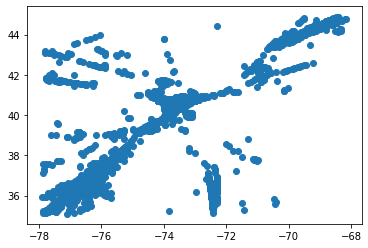

In [38]:
plt.scatter(threat_df['threat_ac1_lon'], threat_df['threat_ac1_lat'])

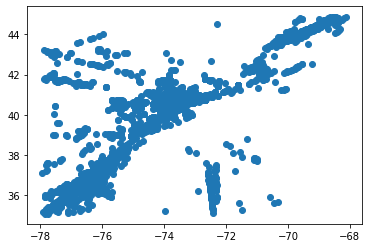

In [39]:
plt.scatter(threat_df['threat_ac2_lon'], threat_df['threat_ac2_lat'])

In [40]:
threat_df1 = threat_df[['id', 'threat_ts']]
threat_df2 = threat_df[['threat_ac2_id', 'threat_ts']]
threat_df1.columns = threat_df2.columns = ['id', 'ts']
threat_df1 = threat_df1.merge(flight_data)
threat_df2 = threat_df2.merge(flight_data)
threat_df1 = threat_df1.sort_values(['id', 'ts']).reset_index(drop = True)
threat_df2 = threat_df2.sort_values(['id', 'ts']).reset_index(drop = True)

In [41]:
df = threat_df[['id', 'threat_ac2_id', 'threat_ts']].groupby(['id', 'threat_ac2_id']).count().reset_index(drop = False)
import os
if not(os.path.isdir("Threats")):
    os.mkdir("Threats")

print(df.shape[0])

57218


/home/atc/anaconda3/envs/tf/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  This is separate from the ipykernel package so we can avoid doing imports until
/home/atc/anaconda3/envs/tf/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


KeyboardInterrupt: 

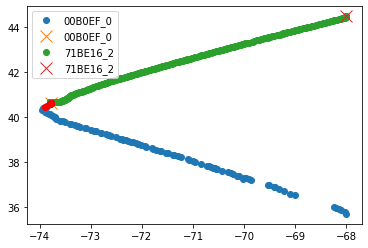

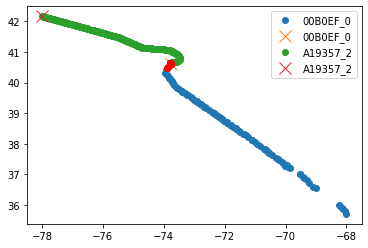

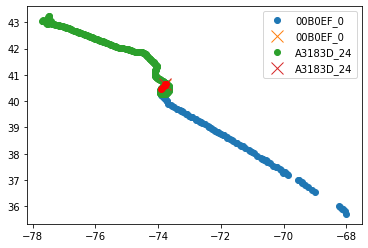

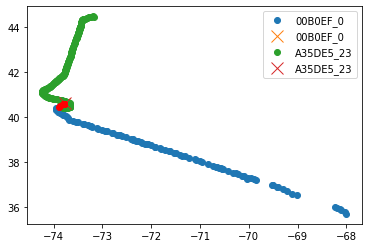

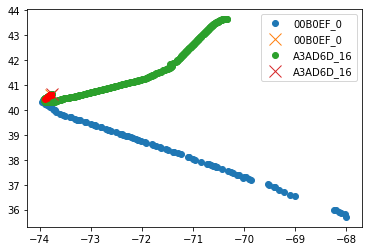

...

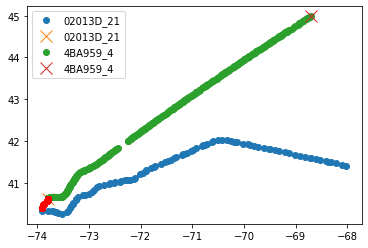

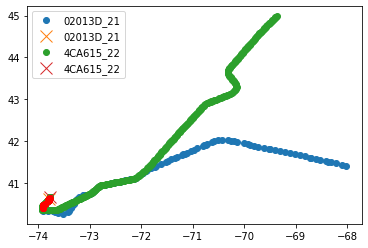

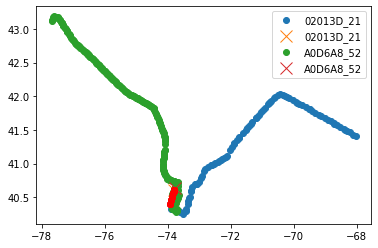

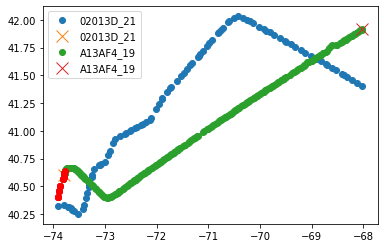

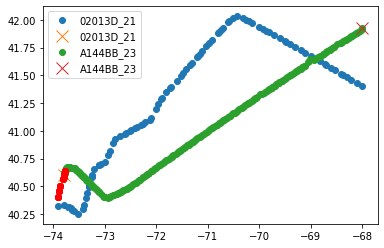

Error in callback <function flush_figures at 0x7f02f9eb2620> (for post_execute):


KeyboardInterrupt: 

In [41]:
for i in range(df.shape[0]):
    ac_data = pd.concat([landing_ac_data2[landing_ac_data2['id'] == df['id'].iloc[i]],
                         flight_data[flight_data['id'] == df['threat_ac2_id'].iloc[i]]], axis = 0)
    ac_data = ac_data.groupby(['id'])
    fig, ax = plt.subplots()
    threat_df_temp1 = threat_df1[(threat_df1['id'] == df['id'].iloc[i])]
    threat_df_temp2 = threat_df2[(threat_df2['id'] == df['threat_ac2_id'].iloc[i])]
    for name, group in ac_data:
        ax.plot(group.lon, group.lat, marker='.', linestyle='', ms=12, label=name)
        last_pt = group.reset_index(drop = False).groupby(['id']).last()
        ax.plot(last_pt.lon, last_pt.lat, marker='x', linestyle='', ms=12, label=name)
    
    ax.plot(threat_df_temp1.lon, threat_df_temp1.lat, color='red', marker = 'o', linestyle='')
    ax.plot(threat_df_temp2.lon, threat_df_temp2.lat, color='red', marker = 'o', linestyle='')
    ax.legend()
    plt.savefig("Threats/" + df['id'].iloc[i] + "_" + df['threat_ac2_id'].iloc[i])

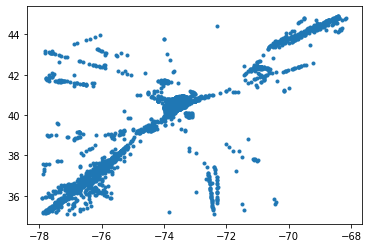

In [35]:
plt.scatter(threat_df1.lon, threat_df1.lat, marker = '.')

In [42]:
threat_subset_df = threat_df1[(threat_df1['lon'] < -76) & threat_df1['lat'] < 36]
threat_subset_df = threat_subset_df[['id', 'lon', 'lat']]
df_subset = threat_subset_df[['id', 'lat']].groupby(['id']).count().reset_index(drop = False)
df_subset = df_subset[['id']]
df_subset = df_subset.merge(threat_df)
print(df_subset.shape[0])

90327


In [ ]:
for i in range(df_subset.shape[0]):
    ac_data = pd.concat([landing_ac_data2[landing_ac_data2['id'] == df_subset['id'].iloc[i]],
                         flight_data[flight_data['id'] == df_subset['threat_ac2_id'].iloc[i]]], axis = 0)
    ac_data = ac_data.groupby(['id'])
    fig, ax = plt.subplots()
    threat_df_temp1 = threat_df1[(threat_df1['id'] == df_subset['id'].iloc[i])]
    threat_df_temp2 = threat_df2[(threat_df2['id'] == df_subset['threat_ac2_id'].iloc[i])]
    for name, group in ac_data:
        ax.plot(group.lon, group.lat, marker='.', linestyle='', ms=12, label=name)
        last_pt = group.reset_index(drop = False).groupby(['id']).last()
        ax.plot(last_pt.lon, last_pt.lat, marker='x', linestyle='', ms=12, label=name)
    
    ax.plot(threat_df_temp1.lon, threat_df_temp1.lat, color='red', marker = 'o', linestyle='')
    ax.plot(threat_df_temp2.lon, threat_df_temp2.lat, color='red', marker = 'o', linestyle='')
    ax.legend()
    plt.savefig("Threats/" + df['id'].iloc[i] + "_" + df['threat_ac2_id'].iloc[i])

In [43]:
critical_df = threat_df[(threat_df['threat_lat_lon_distance'] <= 8000) &
                        (threat_df['threat_altitude_diff_change'] < 0) &
                        (threat_df['threat_altitude_diff'] <= 300) &
                        (threat_df['threat_ts'] < threat_df['id_end_ts'])].reset_index(drop = True)
cols = list(critical_df.columns)
cols[1] = 'ts'
critical_df.columns = cols
print(critical_df.shape)
critical_ids = critical_df['id'].unique()
print(len(critical_ids))

(10975, 16)
3141


/home/atc/anaconda3/envs/tf/lib/python3.7/site-packages/ipykernel_launcher.py:12: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  if sys.path[0] == '':
/home/atc/anaconda3/envs/tf/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


KeyboardInterrupt: 

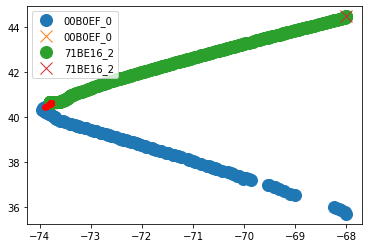

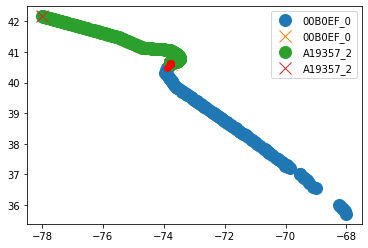

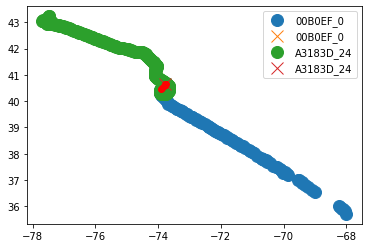

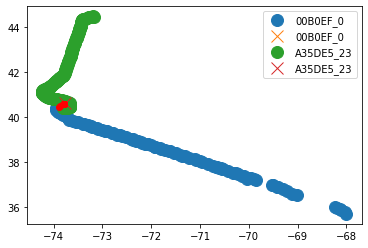

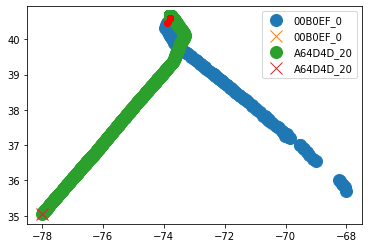

...

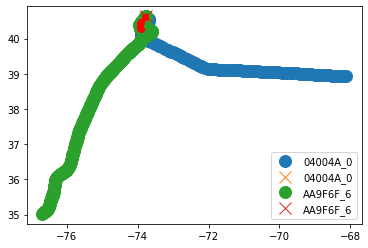

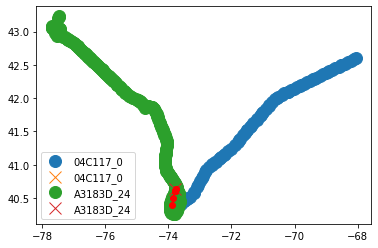

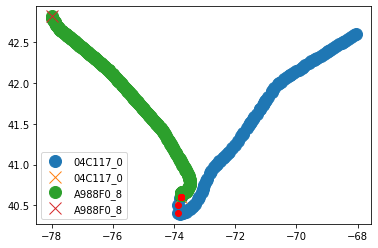

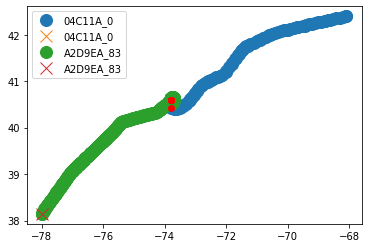

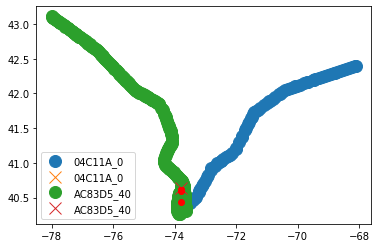

Error in callback <function flush_figures at 0x7f02f9eb2620> (for post_execute):


KeyboardInterrupt: 

In [44]:
import os
import matplotlib
matplotlib.use('Agg')

if not(os.path.isdir("Critical")):
    os.mkdir("Critical")

df = critical_df[['id', 'threat_ac2_id', 'ts']].groupby(['id', 'threat_ac2_id']).count().reset_index(drop = False)

for i in range(df.shape[0]):
    ac_data = pd.concat([landing_ac_data2[landing_ac_data2['id'] == df['id'].iloc[i]],
                         flight_data[flight_data['id'] == df['threat_ac2_id'].iloc[i]]], axis = 0)
    ac_data = ac_data.groupby(['id'])
    threat_df_temp1 = threat_df1[(threat_df1['id'] == df['id'].iloc[i])]
    threat_df_temp2 = threat_df2[(threat_df2['id'] == df['threat_ac2_id'].iloc[i])]
    fig, ax = plt.subplots()
    for name, group in ac_data:
        ax.plot(group.lon, group.lat, marker='o', linestyle='', ms=12, label=name)
        last_pt = group.reset_index(drop = False).groupby(['id']).last()
        ax.plot(last_pt.lon, last_pt.lat, marker='x', linestyle='', ms=12, label=name)
        
    ax.plot(threat_df_temp1.lon, threat_df_temp1.lat, color='red', marker = 'o', linestyle='')
    ax.plot(threat_df_temp2.lon, threat_df_temp2.lat, color='red', marker = 'o', linestyle='')
    ax.legend()
    plt.savefig("Critical/" + df['id'].iloc[i] + "_" + df['threat_ac2_id'].iloc[i])

In [ ]:
critical_df_lat_lon = critical_df[['id', 'ts']].groupby(['id', 'ts']).last().reset_index(drop = False)
critical_df_lat_lon = critical_df_lat_lon.merge(flight_data[['id', 'ts', 'lat', 'lon']], on = ['id', 'ts'], how = "inner")
plt.scatter(critical_df_lat_lon.lon, critical_df_lat_lon.lat, marker = '.')
plt.show()

In [ ]:
reqd_df = critical_df_lat_lon[(critical_df_lat_lon['lon']) < -76 & (critical_df_lat_lon['lat'] < 40)]
reqd_df = reqd_df[['id', 'ts', 'lat', 'lon']]
reqd_df = reqd_df.merge(critical_df, on = ['id', 'ts'])
reqd_df.head()

In [ ]:
for i in range(reqd_df.shape[0]):
    df = pd.concat([flight_data[flight_data['id'] == reqd_df['id'].iloc[i]],
                    flight_data[flight_data['id'] == reqd_df['threat_ac2_id'].iloc[i]]])
    df = df.groupby(['id'])
    fig, ax = plt.subplots()
    for name, group in df:
        ax.plot(group.lon, group.lat, marker='.', linestyle='', ms=12, label=name)
        last_pt = group.reset_index(drop = False).groupby(['id']).last()
        ax.plot(last_pt.lon, last_pt.lat, marker='x', linestyle='', ms=12, label=name)
    
    threat_df_temp1 = threat_df1[(threat_df1['id'] == df_subset['id'].iloc[i])]
    ax.plot(threat_df_temp1.lon, threat_df_temp1.lat, marker = 'o', color = "red")
    ax.legend()

In [ ]:
critical_df.head()

In [ ]:
critical_df = critical_df.merge(landing_ac_data2, on = ['id', 'ts'])
critical_df = critical_df.sort_values(['id', 'ts']).reset_index(drop = True)
critical_df.head()

In [ ]:
critical_df[(critical_df["id"] == "A4034F_99") & (critical_df["threat_ac2_id"] == "00B0F1_12")]

In [ ]:
plt.scatter(critical_df['lon'], critical_df['lat'])
plt.show()

In [ ]:
threat_df.columns = cols
threat_df = threat_df.merge(landing_ac_data2)
plt.scatter(threat_df['lon'], threat_df['lat'])
plt.show()

In [ ]:
cols = list(conflict_df.columns)
cols[0] = 'id'
conflict_df.columns = cols
conflict_df = conflict_df.merge(landing_ac_data2)
plt.scatter(conflict_df['lon'], conflict_df['lat'])
plt.show()

In [ ]:
uniq_id = landing_ac_data2['id'].unique()
ac1 = uniq_id[0]

In [ ]:
plt.scatter(critical_df['lon'], critical_df['lat'])

In [ ]:
ac1_df = landing_ac_data2[landing_ac_data2['id'] == ac1]
min_ts = ac1_df['last_ts'].iloc[0]
max_ts = ac1_df['ts'].iloc[ac1_df.shape[0] - 1]
other_ac_df = landing_ac_data2[landing_ac_data2['id'] != ac1]
other_ac_df['ts_overlap'] = ((other_ac_df['ts'] >= min_ts) & (other_ac_df['ts'] <= max_ts)) | ((other_ac_df['last_ts'] >= min_ts) & (other_ac_df['last_ts'] <= max_ts))
other_ac_df = other_ac_df.groupby(['id']).ts_overlap.sum().reset_index(drop = False)
other_ac_df = other_ac_df[other_ac_df['ts_overlap'] > 0]
other_ac_df = other_ac_df[['id']].merge(landing_ac_data2[landing_ac_data2['id'] != ac1])
other_ac_df = other_ac_df.sort_values(['id', 'ts']).reset_index(drop = True)
prev_dists = []
prev_closest = []
min_lat_lon_dist = []
min_alt_dist = []
reqd_ac = []
for i in range(ac1_df.shape[0]):
    env_ts_df = other_ac_df[(other_ac_df['id_start_ts'] <= ac1_df.ts.iloc[i]) &
                            (other_ac_df['id_end_ts'] >= ac1_df.ts.iloc[i])]
    env_ts_df = env_ts_df.sort_values(['id', 'ts']).reset_index(drop = True)
    env_ts_df = env_ts_df[env_ts_df['ts'] <= ac1_df['ts'].iloc[i]]
    if env_ts_df.shape[0] > 0:
        env_ts_df = env_ts_df.groupby(['id']).tail(2).reset_index(drop = False)
        env_ts_df['last_lon'] = env_ts_df[['id', 'lon']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
        env_ts_df['last_lat'] = env_ts_df[['id', 'lat']].set_index("id").groupby(level = "id").shift(1).reset_index(drop = True)
        env_ts_df = env_ts_df.groupby(['id']).last().reset_index(drop = False)
#         env_ts_df['bearing'] = env_ts_df.apply(lambda x: get_bearing(lat1 = x['last_lat'], lon1 = x['last_lon'], lat2 = x['lat'], lon2 = x['lon']), axis = 1)
        env_ts_df['ts_diff'] = ac1_df['ts'].iloc[i] - env_ts_df['ts']
        env_ts_df['ground_distance'] = env_ts_df['ts_diff'] * env_ts_df['ground_speed']
        env_ts_df['lat_lon'] = env_ts_df.apply(lambda x: geo_destination((x['lat'], x['lon']), x['ground_distance'], x['azimuth']), axis = 1)
#                 env_ts_df['lat_lon'] = env_ts_df.apply(lambda x: (x['lat'], x['lon']), axis = 1)
        dists = env_ts_df['lat_lon'].apply(lambda x: distance.distance((ac1_df['lat'].iloc[i], ac1_df['lon'].iloc[i]), x).m)
        alts = env_ts_df['altitude']
        ts = env_ts_df['ts']
        ts.index = alts.index = dists.index = env_ts_df['id']    
        min_lat_lon_dist += [dists.min()]
        alt_condition = ((env_ts_df['altitude'] - ac1_df['altitude'].iloc[i]).apply(np.abs) <= min_alt_separation)
        if alt_condition.sum() > 0:
            min_alt_dist += [dists[dists.index[alt_condition]].min()]
        else:
            min_alt_dist += [np.nan]
        if len(prev_dists) != 0:
            common = list(set(dists.index).intersection(set(prev_dists.index)))
            rate = dists[common] - prev_dists[common]
            dist_thr_index = dists.index[dists <= dist_thr]
            idxs = set(common).intersection(set(dist_thr_index))
            reqd_ac += [{(ac1, idx): (ac1_df['ts'].iloc[i], ac1_df['altitude'].iloc[i], ts[idx], alts[idx], dists[idx]) for idx in idxs}]
            df = {"ac1_id": [], "ac1_ts": [], "ac1_altitude": [], "ac2_id": [], "ac2_ts": [], "ac2_altitude": [], "lat_lon_distance": []}
            for idx in idxs:
                df["ac1_id"] += [ac1]
                df["ac1_ts"] += [ac1_df['ts'].iloc[i]]
                df["ac1_altitude"] += [ac1_df['altitude'].iloc[i]]
                df["ac2_id"] += [idx]
                df["ac2_ts"] += [ts[idx]]
                df["ac2_altitude"] += [alts[idx]]
                df["lat_lon_distance"] += [dists[idx]]
            conflict_df = pd.concat([conflict_df, pd.DataFrame(df)], axis = 0)
        prev_dists = dists

In [ ]:
env_ts_df

In [ ]:
env_ts_df.apply(lambda x: geo_destination((x['lat'], x['lon']), x['ground_distance'], x['bearing']), axis = 1)

In [ ]:
i = ac1_df.shape[0] - 6
env_ts_df = other_ac_df[(other_ac_df['id_start_ts'] <= ac1_df.ts.iloc[i]) &
                        (other_ac_df['id_end_ts'] >= ac1_df.ts.iloc[i])]
env_ts_df = env_ts_df.sort_values(['id', 'ts']).reset_index(drop = True)
env_ts_df = env_ts_df[env_ts_df['ts'] <= ac1_df['ts'].iloc[i]]
env_ts_df = env_ts_df.groupby(['id']).last().reset_index(drop = False)
env_ts_df['lat_lon'] = env_ts_df.apply(lambda x: (x['lat'], x['lon']), axis = 1)
dists = env_ts_df['lat_lon'].apply(lambda x: distance.distance((ac1_df['lat'].iloc[i], ac1_df['lon'].iloc[i]), x).m)
print(dists.min())
print(dists[(env_ts_df['altitude'] - ac1_df['altitude'].iloc[i]).apply(np.abs) <= 500].min())

In [ ]:
env_ts_df[dists == dists.min()][['id', 'ts', 'lon', 'lat', 'altitude', 'ground_speed', 'azimuth']]

In [ ]:
ac1_df.iloc[i][['id', 'ts', 'lon', 'lat', 'altitude', 'ground_speed', 'azimuth']]

In [ ]:
dists.index = env_ts_df['id']
dists